# Predict Magnetic Structure

In [60]:
import os
#os.environ['OMP_NUM_THREADS'] = '1'
#os.environ['OPENBLAS_NUM_THREADS'] = '1'

import re
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.metrics import accuracy_score, confusion_matrix

from pyhf3 import draw, magstr

save = 'baoso3_dU1.0'
ms = magstr.MagStr(save, num_thread=16)
#os.system('ls output/%s/magstr' % name)

mcn_list = ['rf', 'xgb', 'lgb', 'cat']
mcnf_list = ['(a) RF', '(b) XGB', '(c) LGBM', '(d) CB']

def TestConfMat(mcnf_list, xpad0=-0.5, xpad1=-0.15, ypad=-0.15, shrink=0.8, show_xticks=True):
    fig, ax = plt.subplots(1, 4, figsize=(18, 5), dpi=600, constrained_layout=True)
    
    for i, mcnf in enumerate(mcnf_list):
        if i == 0:
            show_yticks = True
            xpad = xpad0
        else:
            show_yticks = False
            xpad = xpad1
            
        X = np.eye(3)
        ax[i].set_title(mcnf, ha='left', x=xpad, y=1.1)
        im = ax[i].imshow(X, cmap='Blues')
        ax[i].set_xticks([0, 1, 2])
        ax[i].set_yticks([0, 1, 2])
        ax[i].set_xticklabels(['A', 'C', 'G'])
        ax[i].set_yticklabels(['A', 'C', 'G'])
        ax[i].set_ylabel('\nTrue', fontsize='large')
        if not show_xticks:
            ax[i].set_xticklabels([])
            ax[i].set_xlabel('')
        if not show_yticks:
            ax[i].set_yticklabels([])
            ax[i].set_ylabel('')
        for a in range(3):
            for b in range(3):
                ax[i].text(b, a, '%d'%X[a][b], fontsize=32, ha='center')

    cb = fig.colorbar(im, ax=ax.ravel().tolist(), shrink=shrink, pad=0.02)
    cb.set_ticks([0, 1])
    fig.get_layout_engine().set(wspace=0.1)
    if not show_xticks: fig.supxlabel(' ', fontsize='large', y=ypad)
    else:               fig.supxlabel('Predicted', fontsize='large', y=ypad)
    fig.savefig('diagram/%s/test.pdf' % save, bbox_inches='tight')
    plt.show()

def ShowConfMat(dn, mcn_list, mcnf_list, is_validate=False, show_xticks=True):
    fig, ax = plt.subplots(1, 4, figsize=(18, 5), dpi=600, constrained_layout=True)
    labels = ['A', 'C', 'G']
    ypad = -0.12
    
    for i, (mcn, mcnf) in enumerate(zip(mcn_list, mcnf_list)):
        if i == 0:
            show_yticks = True
            xpad = -0.4
        else:
            show_yticks = False
            xpad = -0.1

        if is_validate: y_test, y_pred, _, _, _, _ = ms.Validate(dn[0], dn[1], mcn)
        else: y_test, y_pred, _, _, _ = ms.Train(dn, mcn)
        im = ms.DrawConfMat(y_test, y_pred, ax[i])
        ax[i].set_title(mcnf, ha='left', x=xpad, y=1.1)
        ax[i].set_xticks(range(3))
        ax[i].set_yticks(range(3))
        ax[i].set_xticklabels(labels)
        ax[i].set_yticklabels(labels)
        ax[i].set_ylabel('\nTrue', fontsize='large')
        if not show_xticks:
            ax[i].set_xticklabels([])
            ax[i].set_xlabel('')
        if not show_yticks:
            ax[i].set_yticklabels([])
            ax[i].set_ylabel('')
            
    cb = fig.colorbar(im, ax=ax.ravel().tolist(), shrink=0.75, pad=0.02)
    cb.set_ticks([0, 1])
    fig.get_layout_engine().set(wspace=0.1)
    if not show_xticks: fig.supxlabel(' ', fontsize='large', y=ypad)
    else:               fig.supxlabel('Predicted', fontsize='large', y=ypad)
    if is_validate: fig.savefig('diagram/%s/conf_%s.pdf' % (save, dn[1]), bbox_inches='tight')
    else:           fig.savefig('diagram/%s/conf_%s.pdf' % (save, dn), bbox_inches='tight')
    plt.show()
        
def ShowAcc(dn, ax, title='', xpad=-0.12, mv_yticks=False, show_xticks=True, show_yticks=True, show_legend=True):
    with open('%s/%s'%(ms.path_save, dn), 'r') as f: acc = np.genfromtxt(f, skip_header=1)
    eta_range = np.arange(0.1, 0.61, 0.1)
    acc_range = np.arange(0, 1.1, 0.2)
    
    for i, (t, mk, ls) in enumerate(zip(['A', 'C', 'G'], ['s', 'o', '^'], ['-', '--', '-.'])):
        ax.plot(acc[:, 0], acc[:, i+1], label=t, ls=ls, marker=mk, mec='k', ms=12)
    ax.set_title(title, ha='left', x=xpad, y=1.05)
    ax.set_xticks(eta_range, fontsize='small')
    ax.set_yticks(acc_range, fontsize='small')
    ax.set_ylim([-0.1, 1.1])
    ax.grid()

    if show_xticks: ax.set_xlabel(r'$\eta_\mathrm{test}$', fontsize='large')
    else: 
        ax.set_xticks(eta_range, fontsize='small')
        ax.set_xticklabels([])
    if show_yticks: ax.set_ylabel('\nAccuracy', labelpad=18, fontsize='large')
    else:
        ax.set_yticks(acc_range, fontsize='small')
        ax.set_yticklabels([])
    if mv_yticks:
        acc_range_new = np.arange(0, 1.1, 0.1)
        ax.set_yticks(acc_range_new, fontsize='small')
        ax.set_yticklabels(['%.1f'%a for a in acc_range_new])
        ax.set_ylim([0.75, 1.05])
        ax.yaxis.tick_right()
    if show_legend: ax.legend(fontsize='small', labelspacing=0.1, borderpad=0.3)
    
def ShowUBD(save, type, JU, N, U, dln, dkn, xlim1=10, xlim2=20):
    fig, ax = plt.subplots(figsize=(8, 5), dpi=600, constrained_layout=True)
    dr = draw.Draw(save, JU, 0)
    emin, emax, _, _ = dr.DrawBand(type, N, U, ax=ax, is_unfold=1)
    ax.set_xlabel(' ')
    fig.savefig('diagram/%s/uband.pdf' % save)
    plt.show()

    fig, ax = plt.subplots(1, 5, figsize=(14, 5), dpi=600, constrained_layout=True)
    x, y, _ = ms.DrawDOS(dln, type[0], JU, N, U, ax=ax[0], point=0)
    ax[0].fill_betweenx(y, x, alpha=0.5)
    ax[0].set_xticks([0, xlim1])
    ax[0].set_xlim(0, xlim1+2)
    ax[0].set_xlabel(r'$\rho_\mathrm{LDOS}$')

    for i in range(ms.Nhsp):
        x, y, _ = ms.DrawDOS(dkn, type[0], JU, N, U, ax=ax[i+1], point=i)
        ax[i+1].fill_betweenx(y, x, alpha=0.5)
        #ax[i+1].legend([ms.labels[i].replace('G', r'$\Gamma$')], handlelength=0, handletextpad=0, edgecolor='k', fontsize='x-small')
        ax[i+1].text(0.91, 0.94, ms.labels[i].replace('G', r'$\Gamma$'),\
                     transform=ax[i+1].transAxes, size=28, va='top', ha='right',\
                     bbox=dict(boxstyle='square', fc='none', ec='k'))
        ax[i+1].set_xticks([0, xlim2])
        ax[i+1].set_xlim(0, xlim2+30)
    #ax[4].legend(ms.labels[3], handlelength=0, handletextpad=0, edgecolor='k', fontsize='x-small', loc='lower right')

    for i in range(0, ms.Nhsp+1):
        ax[i].set_ylim(emin, emax)
        ax[i].axhline(0, ls=':', lw=2, color='dimgrey')
        ax[i].set_yticks([-2, 0])
        ax[i].set_yticklabels(['' for _ in [-2, 0]])
    ax[2].set_xlabel(r'                   $\rho_{\bf{k}}$')
    fig.savefig('diagram/%s/udos.pdf' % save)
    plt.show()

def ShowBar(save, type, JU, N, U, dn, xlim=20):
    fig, ax = plt.subplots(1, 4, figsize=(14, 6), dpi=600, constrained_layout=True)
    
    for i in range(ms.Nhsp):
        y, _, peak = ms.DrawDOS(dn, type[0], JU, N, U, point=i)
        x = range(len(y))
        ax[i].barh(x[:32], y[:32])
        ax[i].barh(x[32:], y[32:], color='tab:red')
        #ax[i].legend([ms.labels[i].replace('G', r'$\Gamma$')], handlelength=0, handletextpad=0, borderpad=0.3, borderaxespad=0.3, edgecolor='k', fontsize='small')
        ax[i].text(0.9, 0.95, ms.labels[i].replace('G', r'$\Gamma$'),\
                     transform=ax[i].transAxes, size=28, va='top', ha='right',\
                     bbox=dict(boxstyle='square', fc='none', ec='k'))
        ax[i].set_xlim(0, xlim+20)
        ax[i].set_xticks([0, 250], labels=[0, 250], fontsize='small')
        ax[i].set_yticks([0, 31, 32, 63], labels=['%s01'%ms.labels[i],\
                                                 '\n%s32'%ms.labels[i],\
                                                 '%s33\n'%ms.labels[i],\
                                                 '%s64'%ms.labels[i]], fontsize='small')
        ax[i].axhline(np.median(x), ls=':', lw=2, color='dimgrey')

        for j in range(ms.PEAK_MAX):
            color = 'r' if peak[j][1] > 32 else 'b'
            coord = (peak[j][0]+20, peak[j][1])
            ax[i].annotate('', xy=coord, xycoords='data',\
                          xytext=(coord[0]+75, coord[1]), textcoords='data',
                          arrowprops=dict(arrowstyle="simple",\
                                          connectionstyle="arc3",\
                                          color=color))
    ax[0].set_ylabel('Feature index', fontsize='large')
    ax[1].set_xlabel(r'                   $\rho_{\bf{k}}$', fontsize='large')
    fig.savefig('diagram/%s/bar.pdf' % save)
    plt.show()

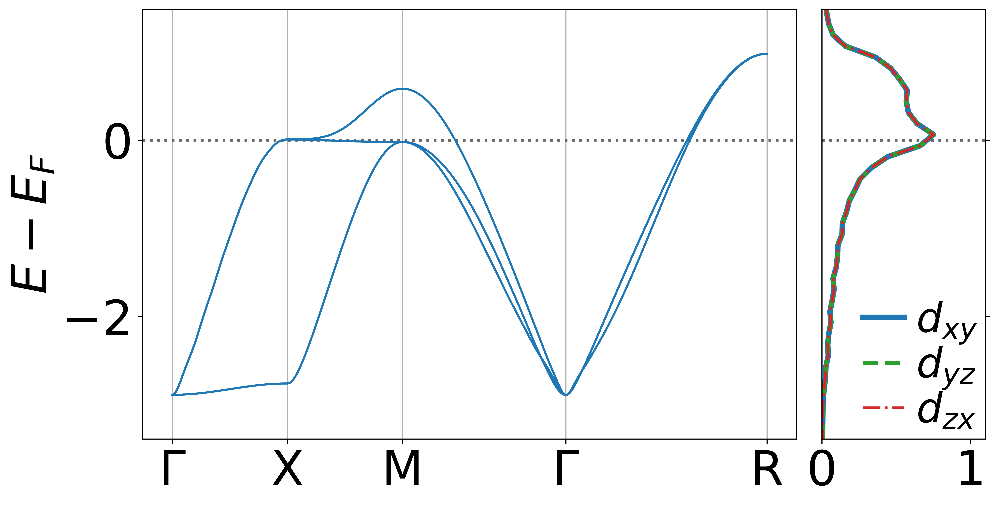

In [3]:
dr = draw.Draw('baoso3', 0, 0)
fig, ax = plt.subplots(1, 2, width_ratios=[4, 1], figsize=(10, 5), dpi=600, constrained_layout=True)
emin, emax, _, _ = dr.DrawBand('f', 4, 0, ax[0], is_unfold=0)
dr.DrawDOS('f', 4, 0, ax[1], emin, emax)
fig.savefig('diagram/%s/f.eps' % save)
plt.show()

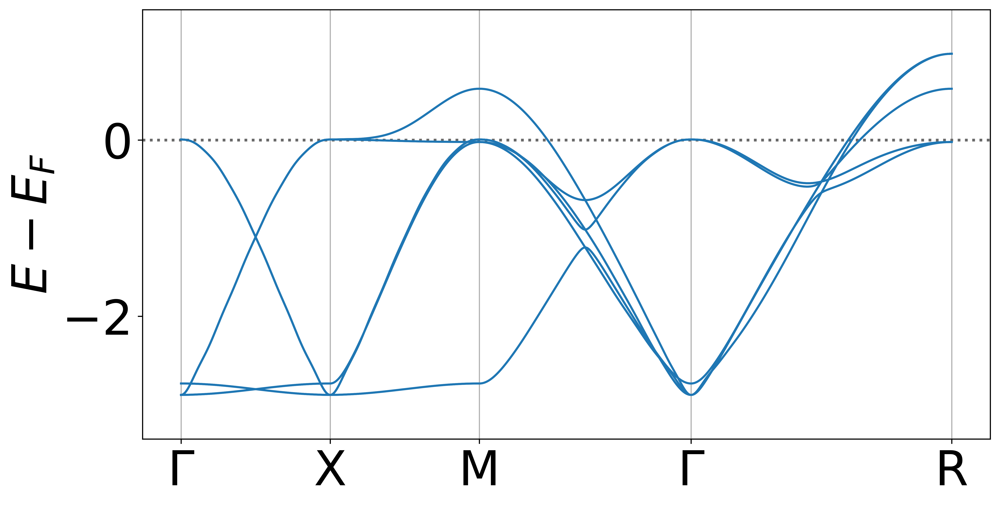

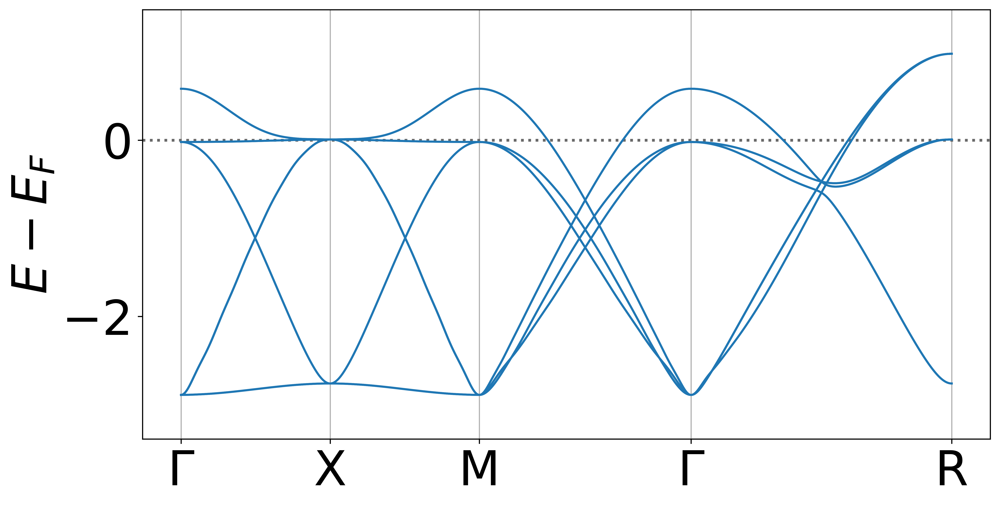

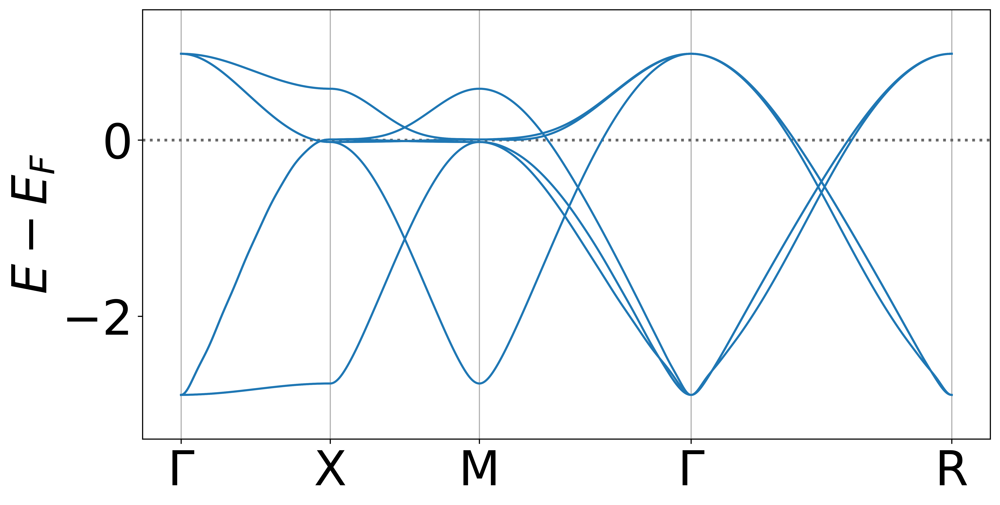

In [4]:
dr = draw.Draw(save, 0, 0)
for t in ['a0', 'c0', 'g0']:
    fig, ax = plt.subplots(figsize=(10, 5), dpi=600, constrained_layout=True)
    dr.DrawBand(t, 8, 0, ax, is_unfold=0)
    fig.savefig('diagram/%s/%s.eps' % (save, t))
    plt.show()

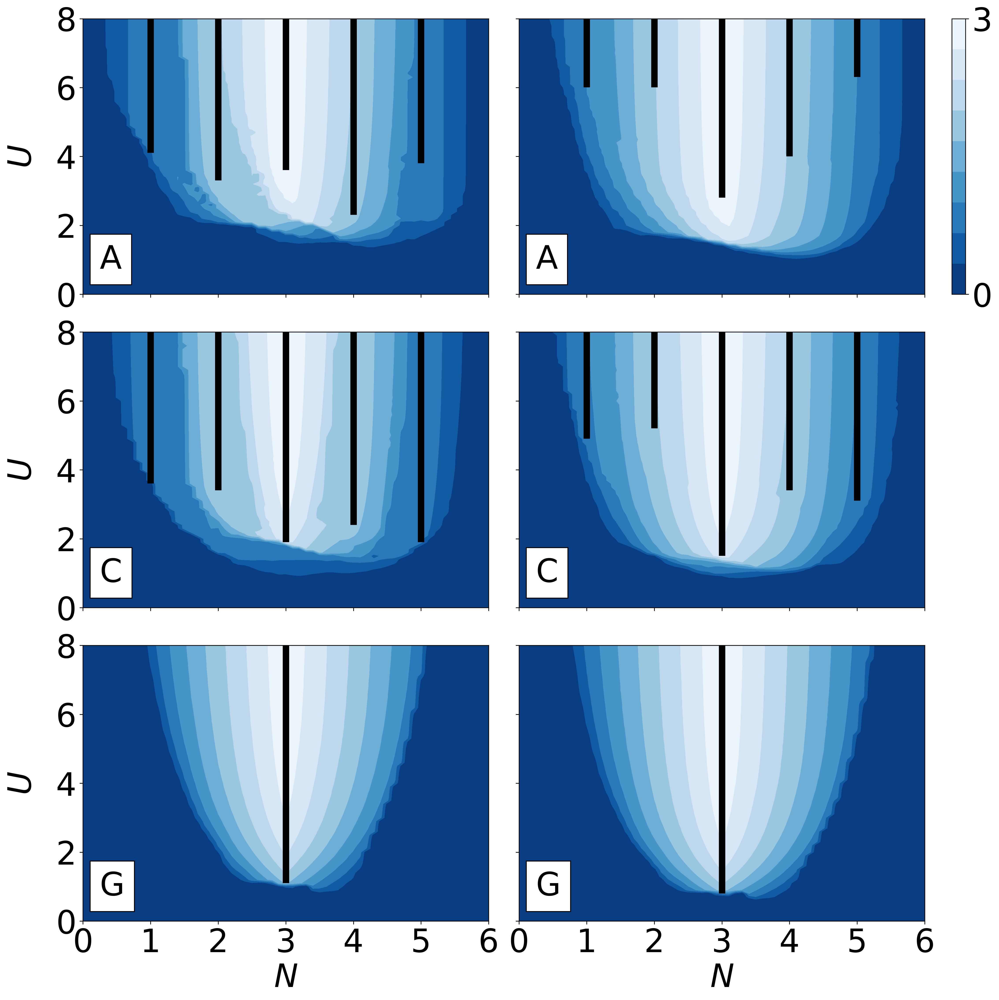

In [33]:
fig, ax = plt.subplots(3, 2, figsize=(15, 15), dpi=300, constrained_layout=True)

for i, ju in enumerate([0, 0.15]):
    dr = draw.Draw('baoso3_dU0.1', ju, 0)
    show_yticks = False if ju > 0 else True
    for j, t in enumerate(['a', 'c', 'g']):
        show_xticks = False if t != 'g' else True
        cf = dr.DrawPhase(t, ax=ax[j][i], show_xticks=show_xticks, show_yticks=show_yticks)
        
cb = fig.colorbar(cf, ax=ax[0, :], shrink=1, pad=0.02)
cb.set_ticks([0, 6])
cb.set_ticklabels(['0', '3'])
fig.savefig('diagram/%s/phase_frame.eps' % (save))
fig.savefig('diagram/%s/phase.png' % (save), transparent=True)
plt.show()

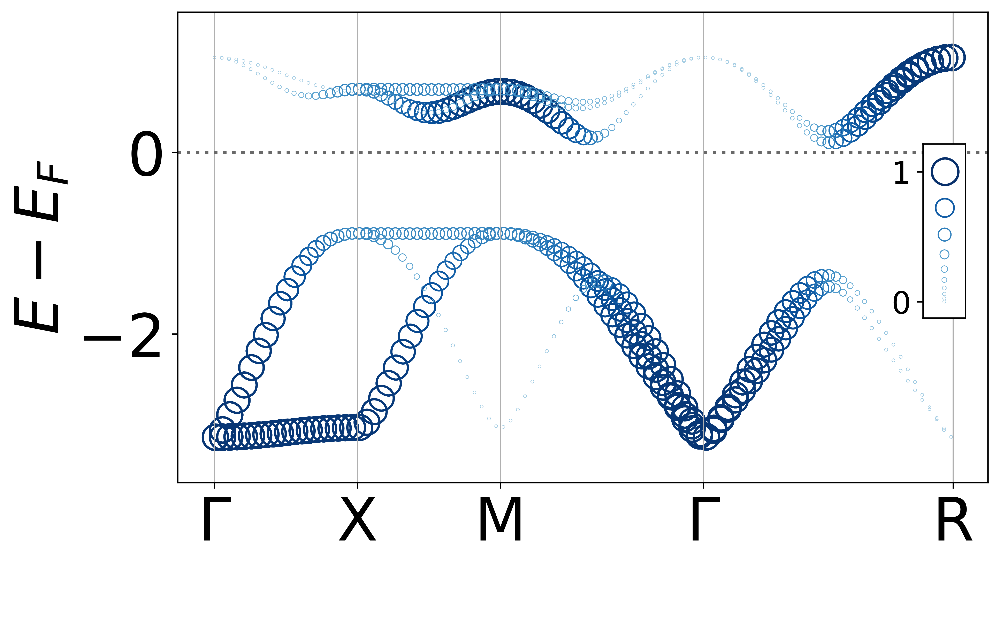

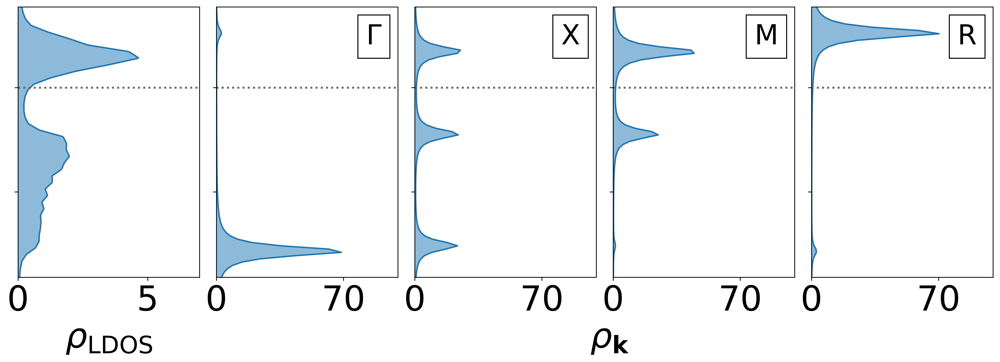

In [61]:
ShowUBD(save, 'g0', 0, 6, 2,\ 
        'dos_ML_eta0.10.h5',\
        'dos_MK_eta0.10_bins256.h5',\
        xlim1=5, xlim2=70)

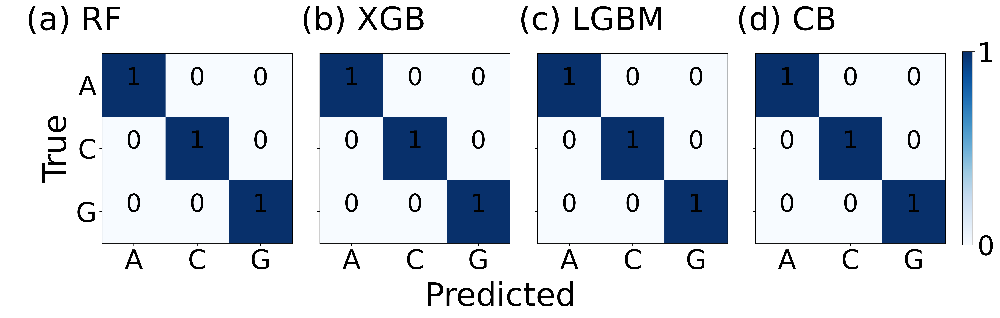

In [35]:
TestConfMat(mcnf_list, xpad0=-0.4, xpad1=-0.1, ypad=-0.12, shrink=0.75, show_xticks=True)


# Data : dos_ML_eta0.20.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.905618 (806/890)
# Elapsed Time : 0.253057s


# Data : dos_ML_eta0.20.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.919101 (818/890)
# Elapsed Time : 0.136461s


# Data : dos_ML_eta0.20.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.923596 (822/890)
# Elapsed Time : 0.097278s


# Data : dos_ML_eta0.20.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.929213 (827/890)
# Elapsed Time : 0.177112s



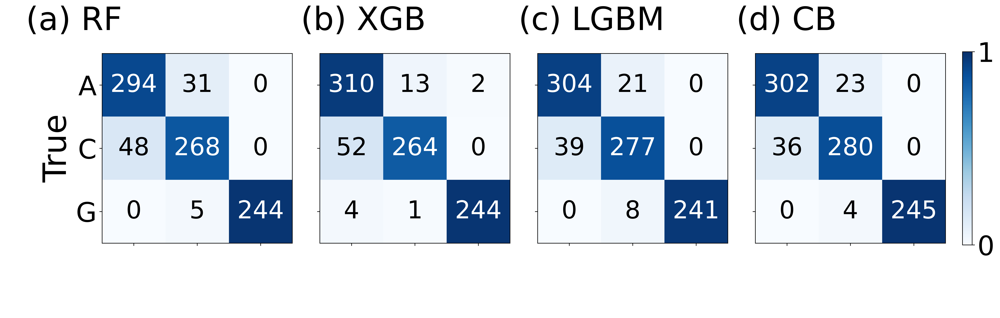


# Data : dos_MK_eta0.20_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.977528 (870/890)
# Elapsed Time : 0.252295s


# Data : dos_MK_eta0.20_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.977528 (870/890)
# Elapsed Time : 0.129844s


# Data : dos_MK_eta0.20_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.975281 (868/890)
# Elapsed Time : 0.087255s


# Data : dos_MK_eta0.20_bins256.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.978652 (871/890)
# Elapsed Time : 0.164597s



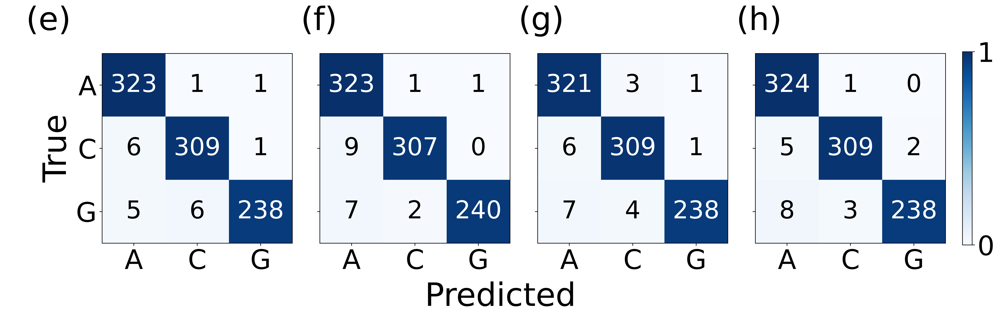

In [10]:
ShowConfMat('dos_ML_eta0.20.h5',\
           mcn_list,\
           mcnf_list,\
           show_xticks=False)
ShowConfMat('dos_MK_eta0.20_bins256.h5',\
           mcn_list,\
           ['(e)', '(f)', '(g)', '(h)'])

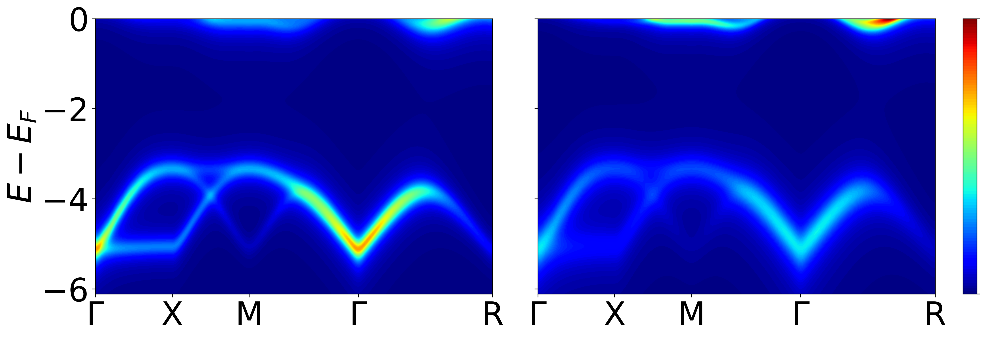

In [34]:
d1n = 'dos_MKf_eta0.20_bins256.h5'
d2n = 'dos_MKfb_eta0.50_bins256.h5'
cmax = 11

fig, ax = plt.subplots(1, 2, figsize=(15, 5), dpi=300, constrained_layout=True)
ms.DrawSpec(d1n, 'g0', 0, 8, 6, ax=ax[0])
cf = ms.DrawSpec(d2n, 'g0', 0, 8, 6, ax=ax[1], show_yticks=False)    
cb = fig.colorbar(cf, ax=ax.ravel().tolist(), shrink=1, pad=0.02)
cb.set_ticks([0, cmax])
cb.set_ticklabels([' ', ' '])
fig.get_layout_engine().set(wspace=0.05)
fig.savefig('diagram/%s/spec_frame.eps' % (save))
fig.savefig('diagram/%s/spec.png' % (save), transparent=True)
plt.show()


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.970787 (864/890)
# Elapsed Time : 0.233099s


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.977528 (870/890)
# Elapsed Time : 0.134795s


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.973034 (866/890)
# Elapsed Time : 0.087690s


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.977528 (870/890)
# Elapsed Time : 0.165989s



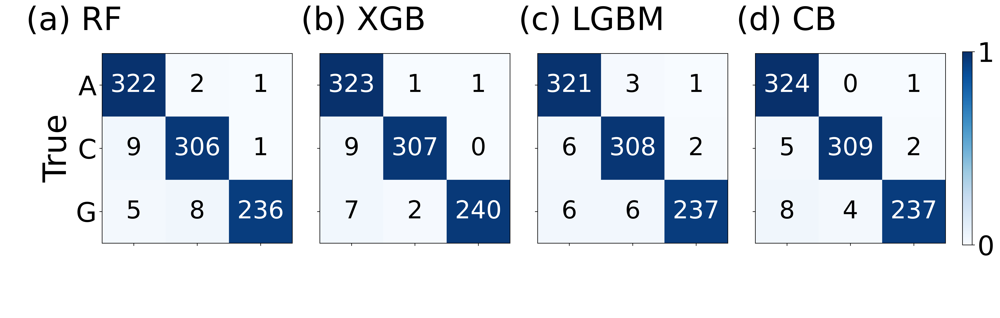


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.970787 (864/890)
# Elapsed Time : 0.232995s


# Data : dos_MKfb_eta0.50_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.885393 (788/890)
# Elapsed Time : 0.216520s


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.977528 (870/890)
# Elapsed Time : 0.124798s


# Data : dos_MKfb_eta0.50_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.934831 (832/890)
# Elapsed Time : 0.123566s


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.973034 (866/890)
# Elapsed Time : 0.095325s


# Data : dos_MKfb_eta0.50_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.942697 (839/890)
# Elapsed Time : 0.092869s


# Data : dos_MKf_eta0.20_bins256.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.977528 (870/890)
# Elapsed Time : 0.165158s


# Data : dos_MKfb_eta0.50_bins256.h5
# Machine : cat
# Resampler : none
# 

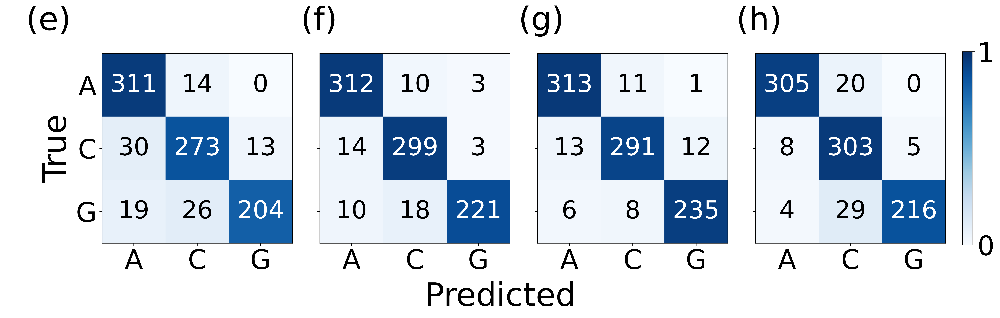

In [11]:
ShowConfMat('dos_MKf_eta0.20_bins256.h5',\
           mcn_list,\
           mcnf_list,\
           show_xticks=False)
ShowConfMat(['dos_MKf_eta0.20_bins256.h5', 'dos_MKfb_eta0.50_bins256.h5'],\
            mcn_list,\
            ['(e)', '(f)', '(g)', '(h)'],\
            is_validate=True)

In [12]:
title_list=['(%s)' % i for i in ['a', 'b', 'c', 'd', 'e', 'f']]
fig, ax = plt.subplots(3, 2, figsize=(15, 15), dpi=600, constrained_layout=True)

for i, eta in enumerate([0.1, 0.2, 0.3]):
    show_xticks = False if eta < 0.3 else True
    for j, t in enumerate(['dos', 'peak']):
        if t == 'peak':
            mv_yticks = True
            show_yticks = False
            show_legend = False
            xpad = -0.05
        else:
            mv_yticks = False
            show_yticks = True
            show_legend = True if eta < 0.2 else False
            xpad = -0.32

        ShowAcc('acc_rf_%s_MK_eta%.2f_bins256.txt' % (t, eta),\
                ax[i][j],\
                title=title_list[2*i+j],\
                xpad=xpad,\
                mv_yticks=mv_yticks,\
                show_xticks=show_xticks,\
                show_yticks=show_yticks,\
                show_legend=show_legend)
fig.get_layout_engine().set(wspace=0.05)
fig.savefig('diagram/%s/acc.pdf' % save)
plt.show()

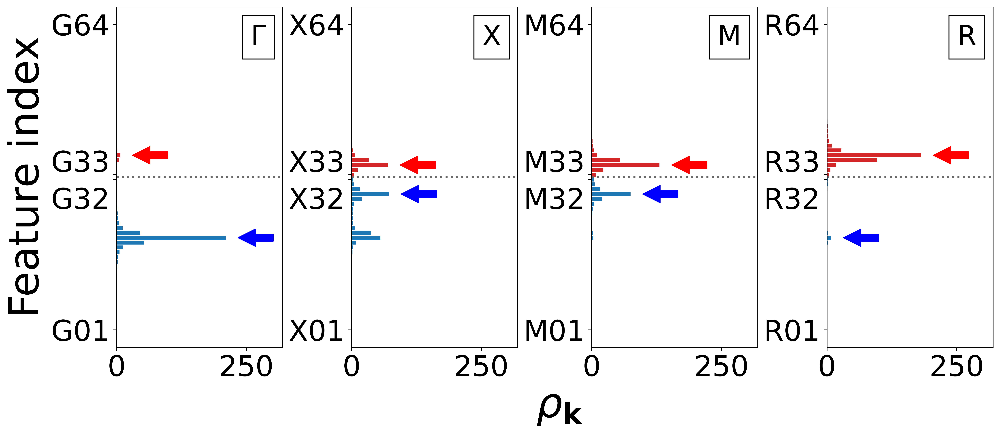

In [57]:
ShowBar(save, 'g0', 0, 6, 2,\
        'dos_MK_eta0.10_bins64.h5',\
        xlim=300)

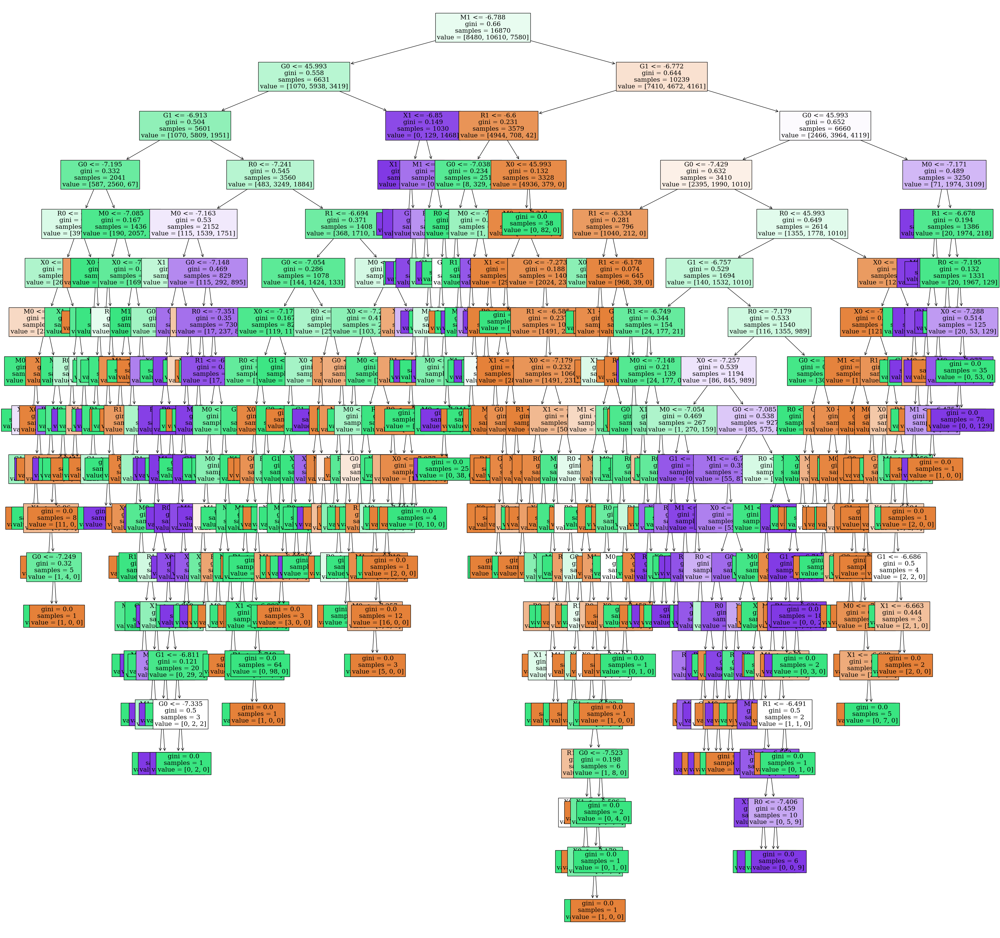

[[18.43]]


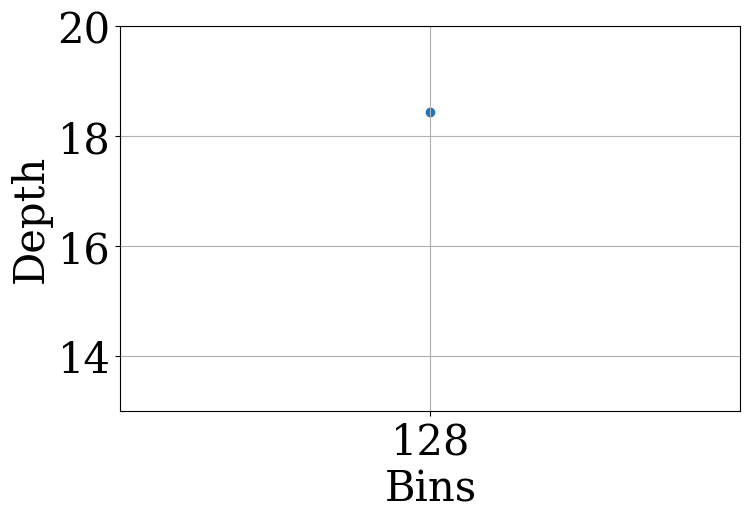

In [7]:
#bins = [2**i for i in range(3, 10)]
bins=[128]
depth_list = []
for b in bins:
    depth, mc = RunTrain('peak_GK_eta0.30_bins%d.h5'%b, ['rf'], [''], [True], show_mat=False)
    depth_list.append(depth)
    fig,ax= plt.subplots(figsize=(40, 40))
    ms.DrawTree(mc, feats=['%s%d' % (l, i) for l in ms.labels for i in range(ms.PEAK_MAX)], ax=ax)
print(depth_list)
fig, ax = plt.subplots(figsize=(8, 5))
x = range(len(bins))
ax.scatter(x, depth_list)
ax.plot(x, depth_list)
ax.set_xticks(x)
ax.set_xticklabels(bins)
ax.set_xlabel('Bins')
ax.set_ylabel('Depth')
ax.set_ylim([13, 20])
ax.grid()
plt.show()

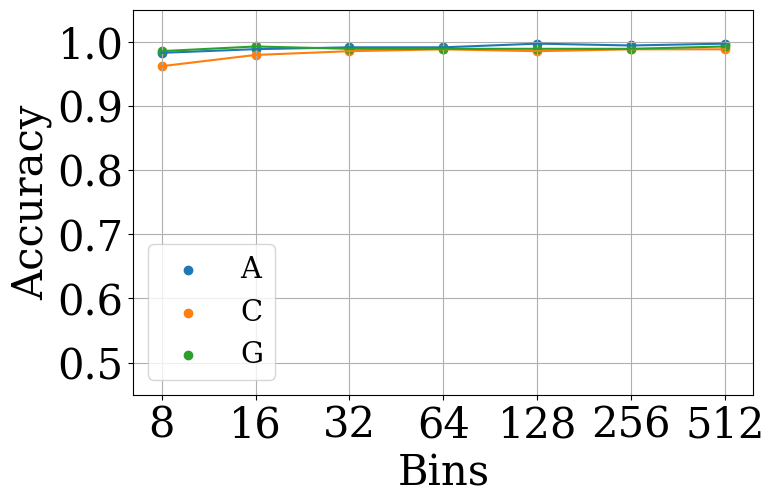

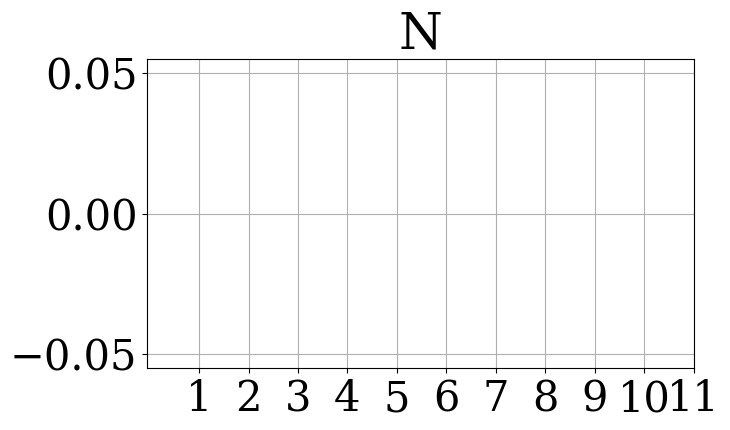

In [26]:
bins = [2**i for i in range(3, 10)]
acc = []
dfs = []
mis_idx = []
for b in bins:
    acci, df = RunTrain('dos_MK_eta0.10_bins%d.h5'%b, ['rf'], ['RF %d'%b], [True], dost=False)
    mis_idx += df[df['type'] != df['type_p']].index.to_list()
    acc.append(acci)
acc = np.array(acc)
fig, ax = plt.subplots(figsize=(8, 5))
x = range(len(acc))
for i, t in enumerate(['A', 'C', 'G']):
    ax.scatter(x, acc[:, i], label=t)
    ax.plot(x, acc[:, i])
ax.set_xticks(x)
ax.set_xticklabels(bins)
ax.set_yticks(np.arange(0.5, 1.1, 0.1))
ax.grid()
ax.set_xlabel('Bins')
ax.set_ylabel('Accuracy')
ax.set_ylim([0.45, 1.05])
ax.legend(fontsize='x-small')
plt.show()

counts = Counter(mis_idx)
mis_idx_common = np.unique([i for i in mis_idx if counts[i] > len(bins)])
df_mis = df.loc[mis_idx_common, :]
fig, ax = plt.subplots(figsize=(8, 5))
df_mis.hist(column='N', ax=ax)
ax.set_xticks(range(1, 12))
fig.tight_layout()
plt.show()

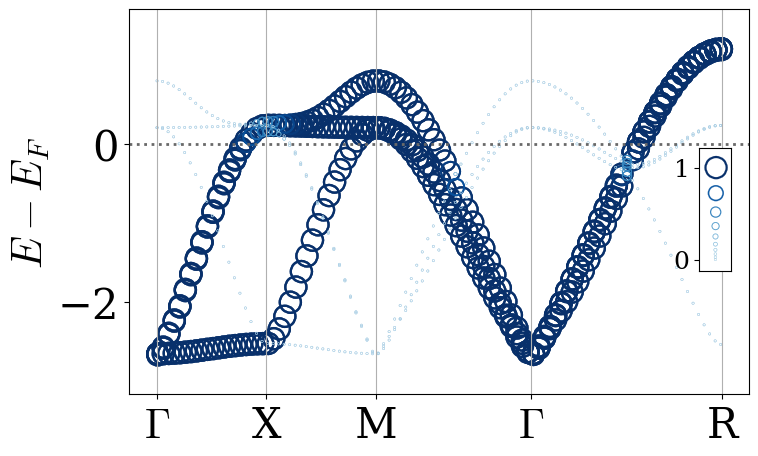

In [8]:
dr = draw.Draw(save, 0, 0)
fig, ax = plt.subplots(figsize=(8, 5))
dr.DrawBand('c0', 6, 1, ax=ax, is_unfold=True)
#dr.DrawBandDOS('f', 4, 0)
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

bins = [2**i for i in range(3, 9)]
acc = []
label = ['MAE', 'MSE', 'RMSE', 'MAPE']
for b in bins:
    y_test, y_pred, y_score, df, rc = ms.Regress('dos_MK_eta0.30_bins%d.h5'%b, 'lr')
    mae  = mean_absolute_error(y_test, y_pred)
    mse  = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    #r2   = r2_score(y_test, y_pred)
    acc.append([mae, mse, rmse, mape])
acc = np.array(acc)

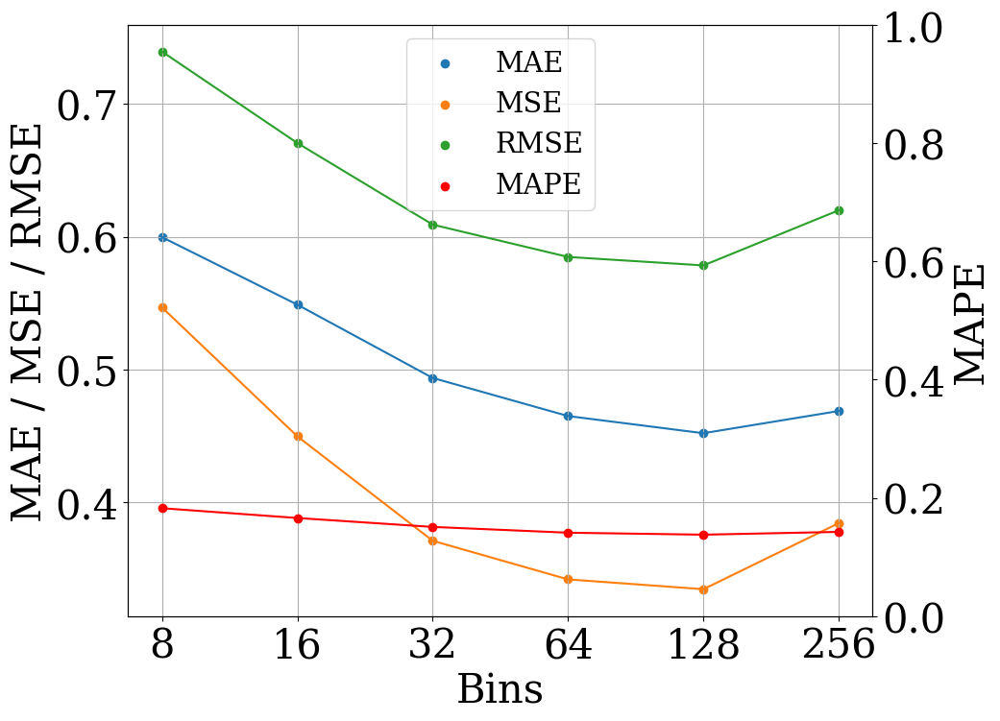

[[0.59972579 0.54682272 0.73947462 0.18240966]
 [0.54889254 0.44972738 0.67061716 0.16585304]
 [0.49369721 0.37108081 0.60916402 0.15077649]
 [0.46500917 0.34200905 0.58481539 0.14100034]
 [0.45208269 0.3346092  0.57845415 0.13765494]
 [0.46880737 0.38436742 0.61997373 0.1423903 ]]


In [86]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

bins = [2**i for i in range(3, 9)]
acc = []
label = ['MAE', 'MSE', 'RMSE', 'MAPE']
for b in bins:
    y_test, y_pred, y_score, df, rc = ms.Regress('dos_GK_eta0.30_bins%d.h5'%b, 'lr')
    mae  = mean_absolute_error(y_test, y_pred)
    mse  = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    #r2   = r2_score(y_test, y_pred)
    acc.append([mae, mse, rmse, mape])
acc = np.array(acc)

fig, ax = plt.subplots(figsize=(10, 8))
ax2 = ax.twinx()
x = range(len(bins))
s_list = []
for i in range(3):
    s = ax.scatter(x, acc[:, i], label=label[i])
    ax.plot(x, acc[:, i], label='_nolegend_')
    s_list.append(s)
    
s = ax2.scatter(x, acc[:, 3], color='r')
ax2.plot(x, acc[:, 3], color='r')
s_list.append(s)
ax2.set_ylim([0, 1])
ax2.set_ylabel('MAPE')
#ax2.legend(fontsize='x-small')

ax.set_xticks(x)
ax.set_xticklabels(bins)
ax.set_xlabel('Bins')
ax.set_ylabel('MAE / MSE / RMSE')
ax.legend(s_list, label, fontsize='x-small', loc='upper center')

ax.grid()
plt.show()
print(acc)


# Data : dos_GK_eta0.10_bins8.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.481637s



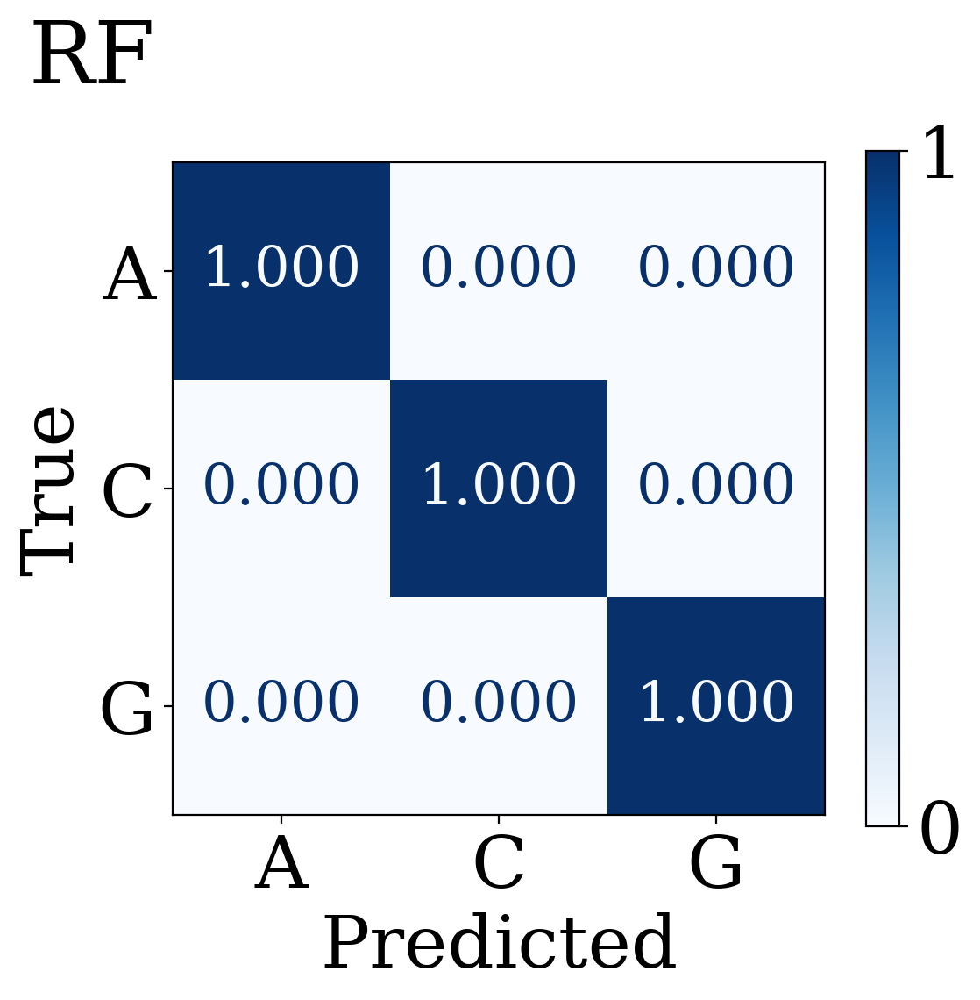


# Data : dos_GK_eta0.10_bins16.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.483913s



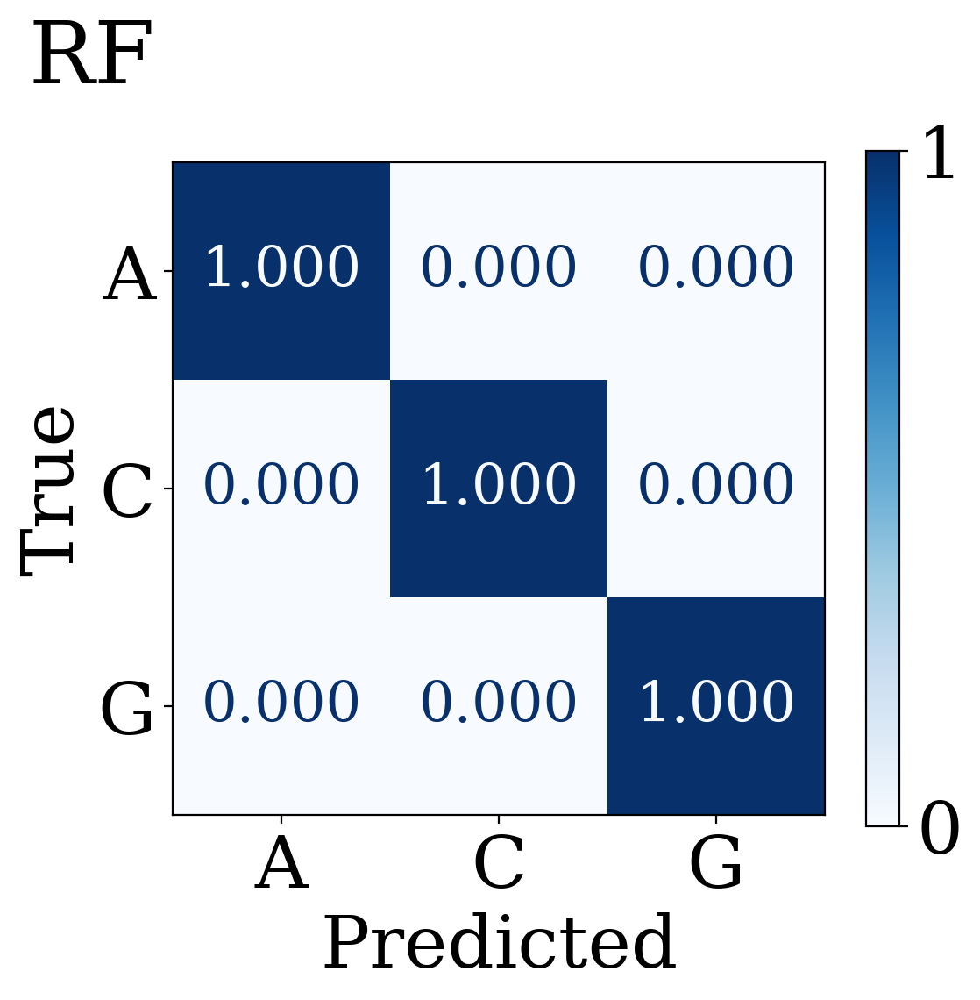


# Data : dos_GK_eta0.10_bins32.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.486476s



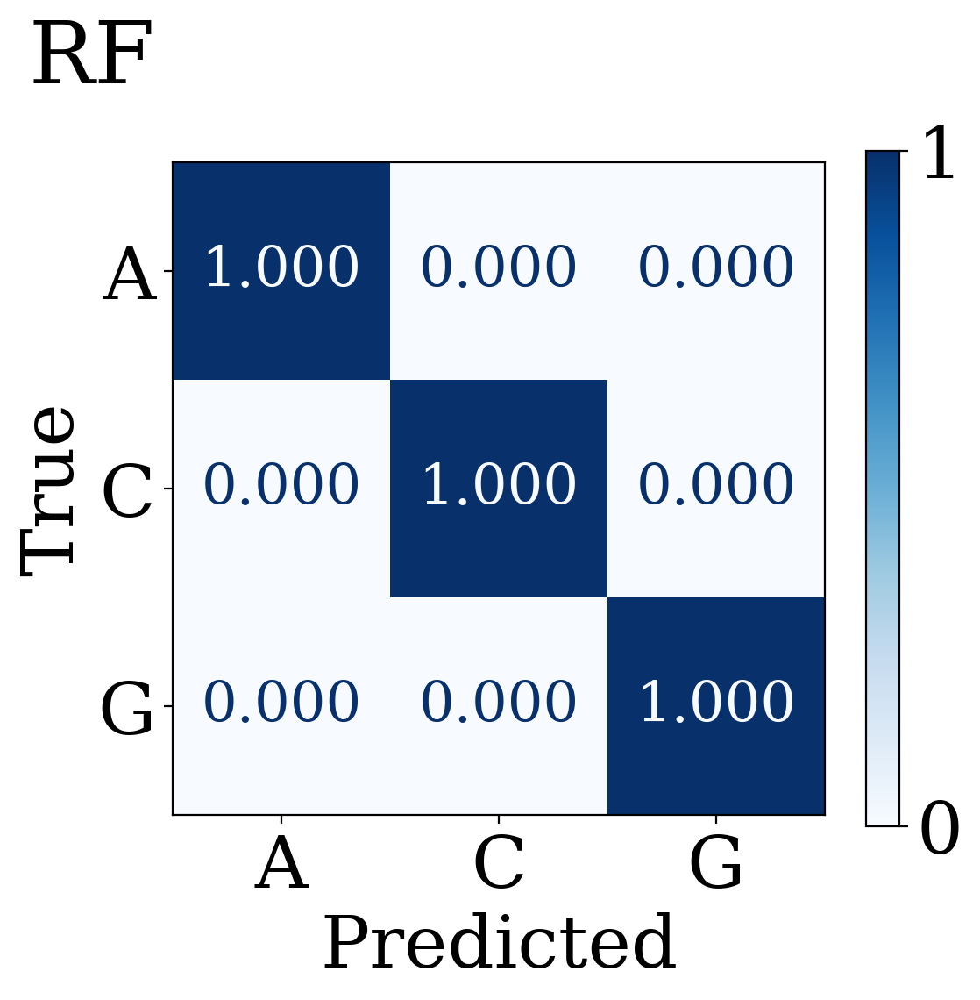


# Data : dos_GK_eta0.10_bins64.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.500384s



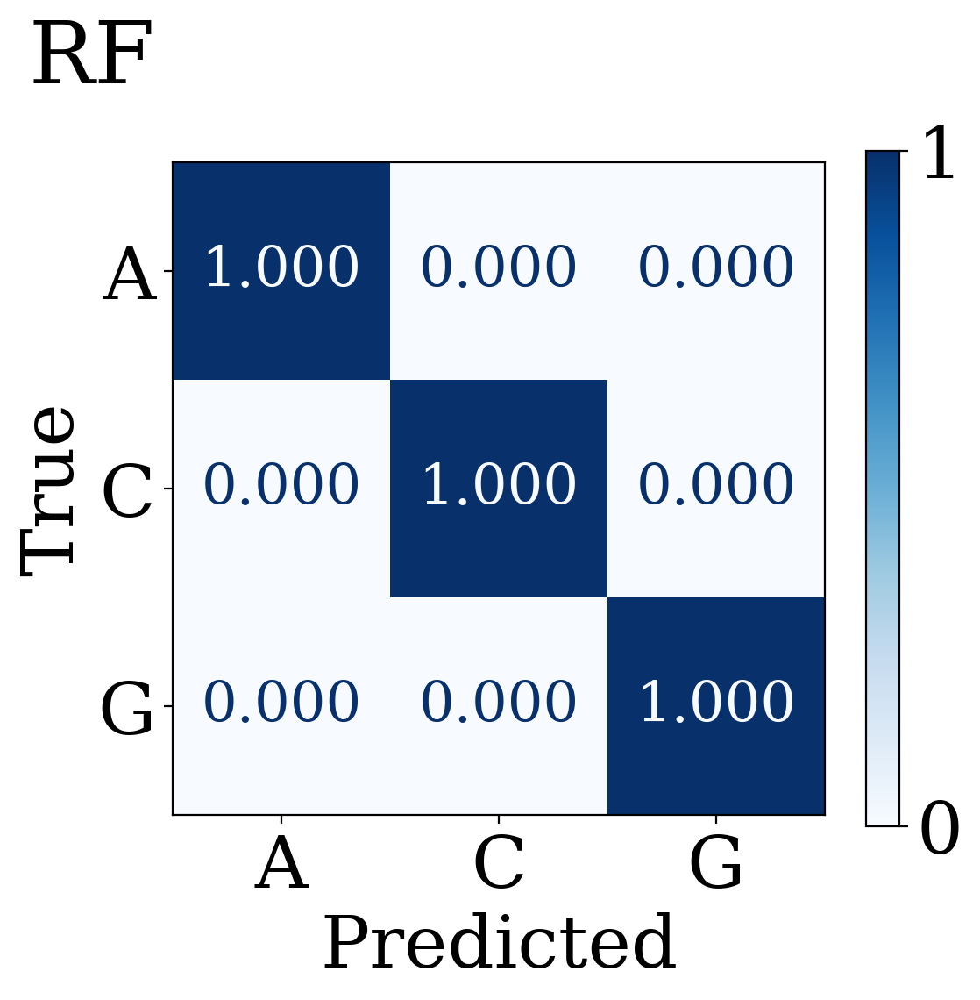


# Data : dos_GK_eta0.10_bins128.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.511301s



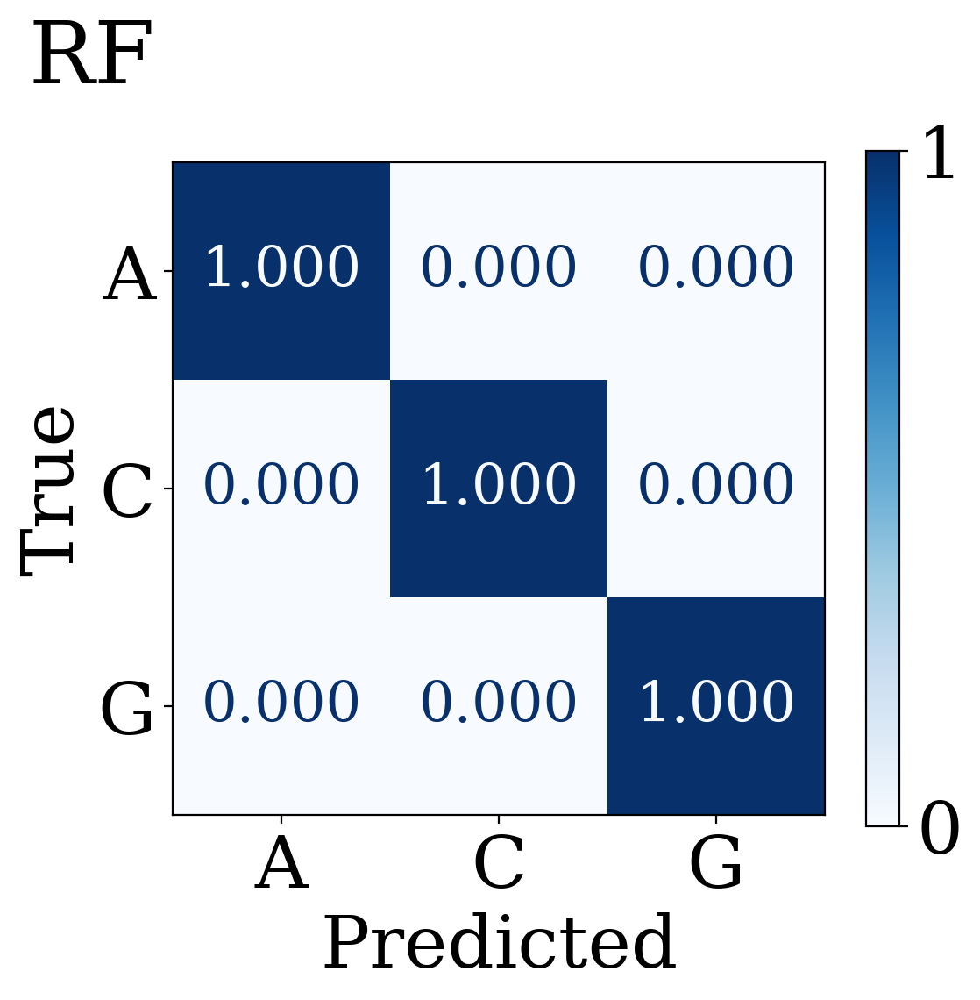


# Data : dos_GK_eta0.10_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.551847s



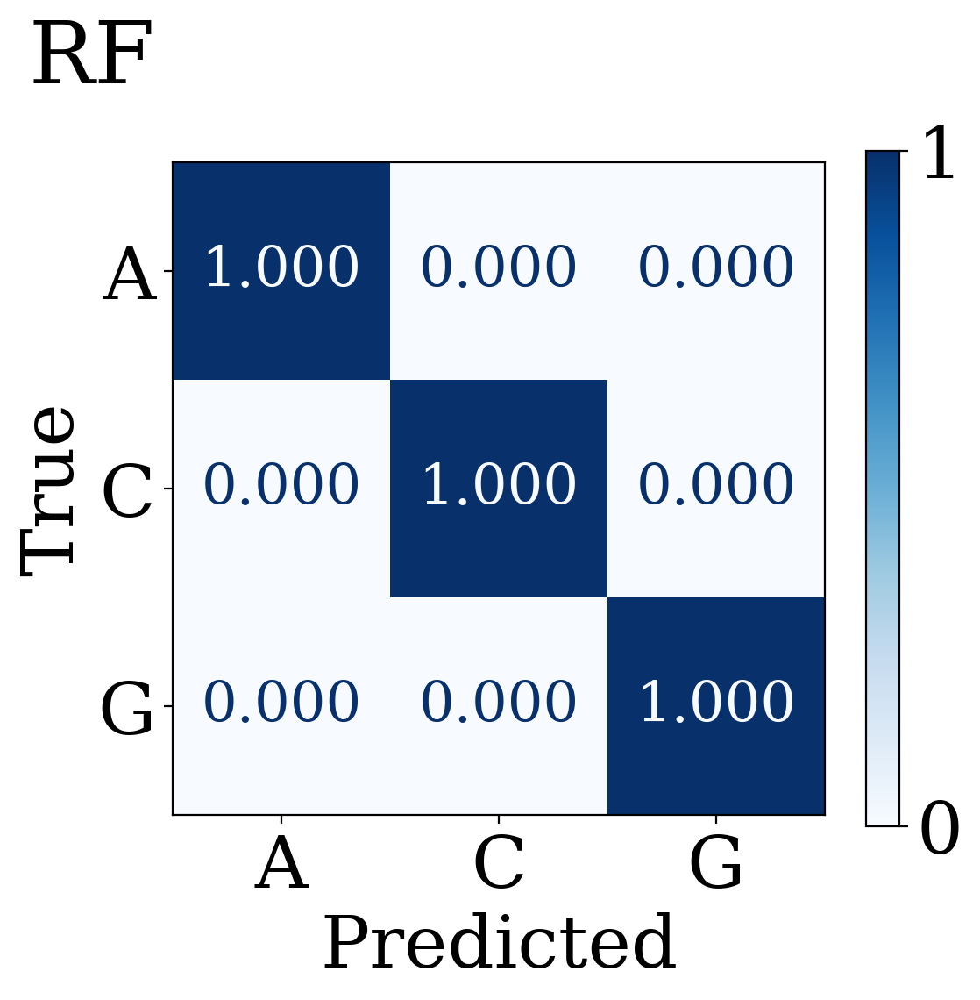


# Data : dos_GK_eta0.10_bins512.h5
# Machine : rf
# Resampler : none
# Accuracy : 1.000000 (4770/4770)
# Elapsed Time : 0.553317s



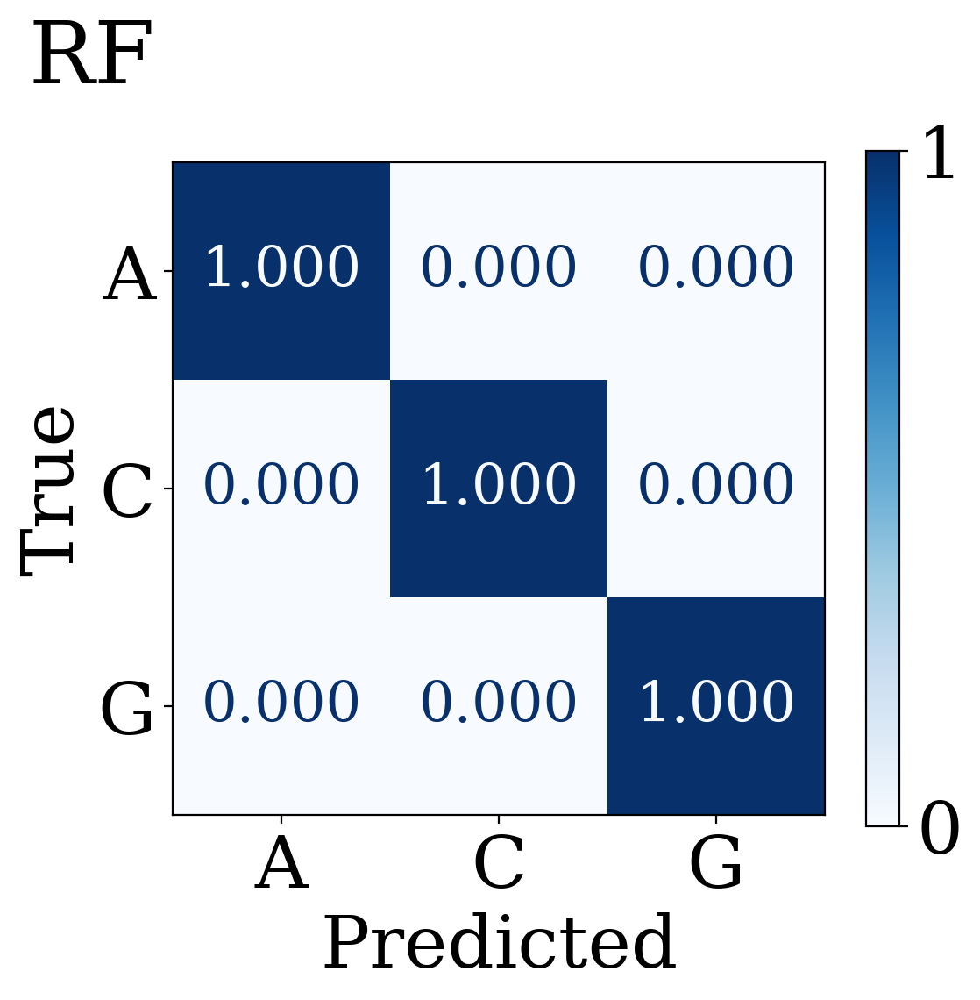

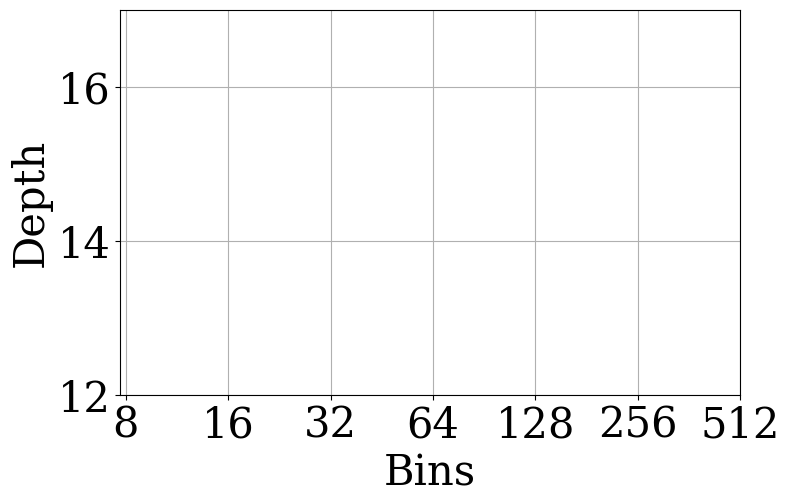

In [3]:
bins = [2**i for i in range(3, 10)]
depth = []
for b in bins:
    depth.append(RunTrain('dos_GK_eta0.10_bins%d.h5'%b, ['rf'], ['RF'], [True]))

fig, ax = plt.subplots(figsize=(8, 5))
x = range(len(depth))
ax.scatter(x, depth)
ax.plot(x, depth)
ax.set_xticks(x)
ax.set_xticklabels(bins)
ax.grid()
ax.set_xlabel('Bins')
ax.set_ylabel('Depth')
ax.set_ylim([12, 17])
plt.show()

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.970819 (865/891)
# Elapsed Time : 0.245749s



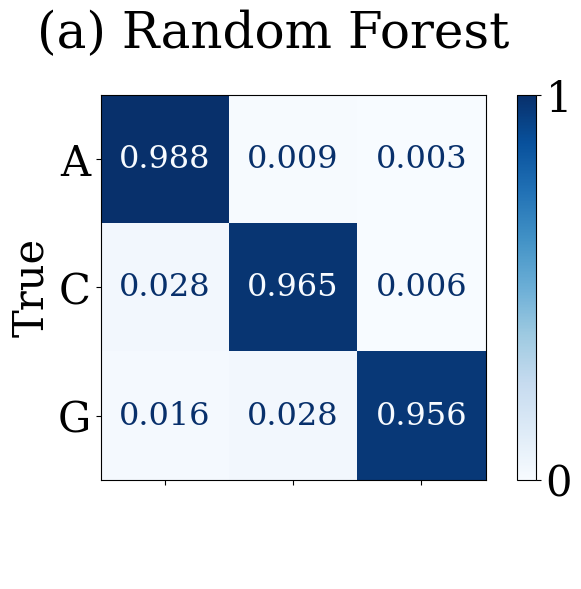

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.971942 (866/891)
# Elapsed Time : 0.122724s



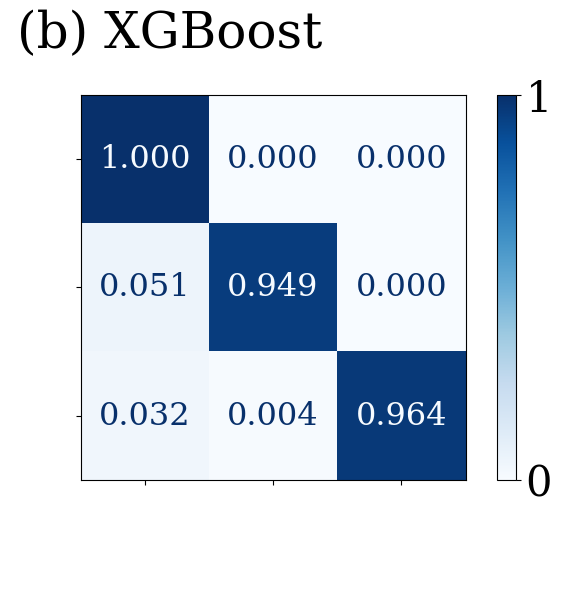

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.969697 (864/891)
# Elapsed Time : 0.088154s



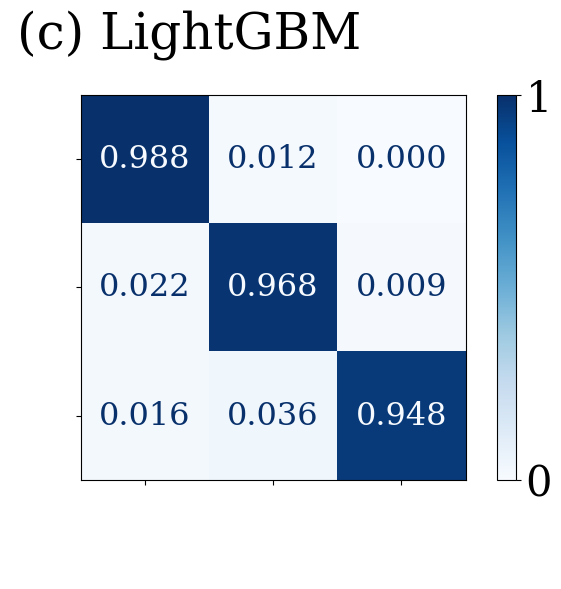

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.973064 (867/891)
# Elapsed Time : 0.159380s



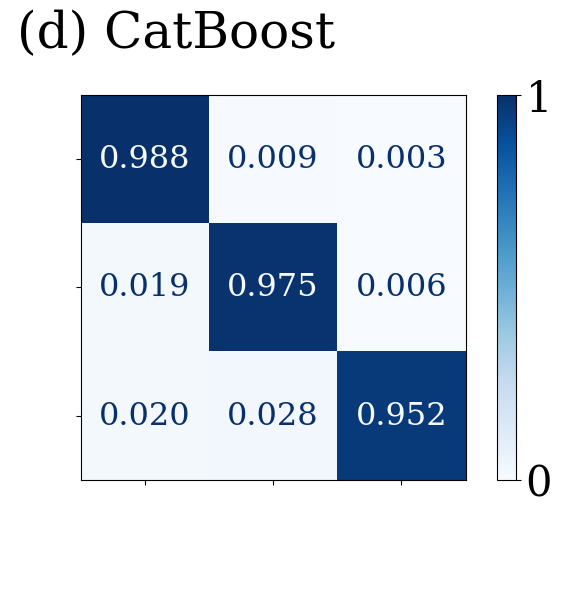

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.970819 (865/891)
# Elapsed Time : 0.227757s

(2968, 1031)

# Data : dos_MKfb_eta0.20_bins256.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.934299 (2773/2968)
# Elapsed Time : 0.370447s



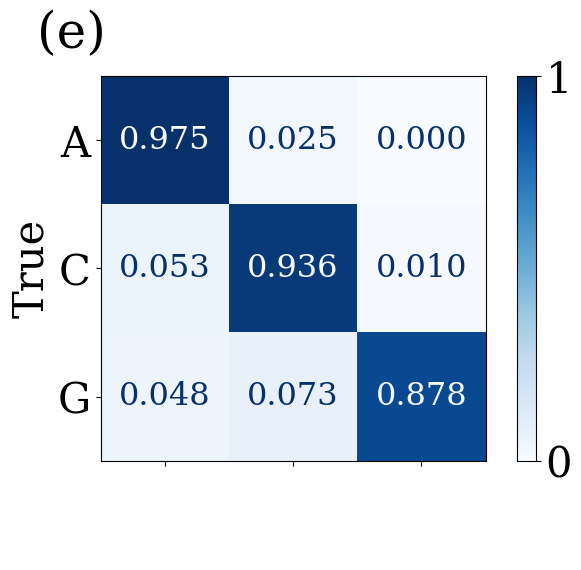

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.971942 (866/891)
# Elapsed Time : 0.128577s

(2968, 1031)

# Data : dos_MKfb_eta0.20_bins256.h5
# Machine : xgb
# Resampler : none
# Accuracy : 0.951146 (2823/2968)
# Elapsed Time : 0.294891s



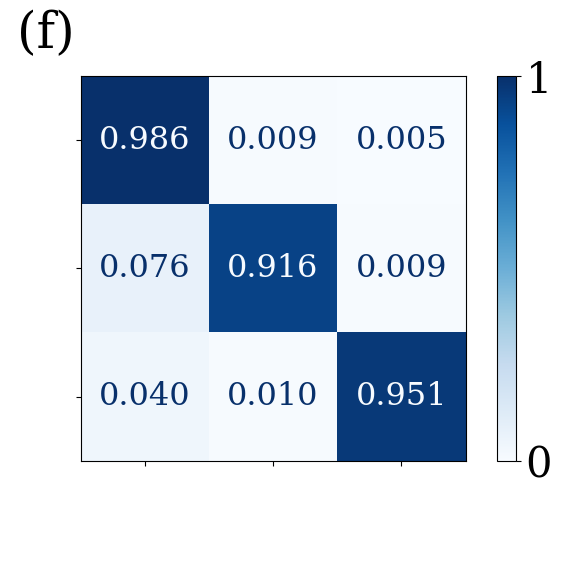

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.969697 (864/891)
# Elapsed Time : 0.091658s

(2968, 1031)

# Data : dos_MKfb_eta0.20_bins256.h5
# Machine : lgb
# Resampler : none
# Accuracy : 0.961253 (2853/2968)
# Elapsed Time : 0.284181s



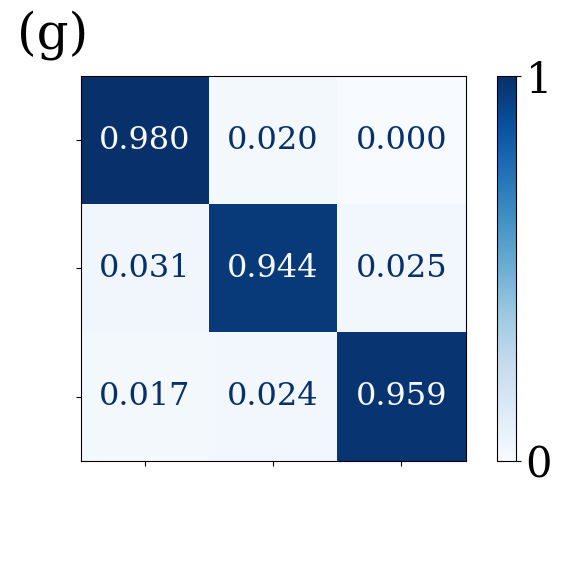

(2968, 1031)

# Data : dos_MKf_eta0.20_bins256.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.973064 (867/891)
# Elapsed Time : 0.164840s

(2968, 1031)

# Data : dos_MKfb_eta0.20_bins256.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.952156 (2826/2968)
# Elapsed Time : 0.324529s



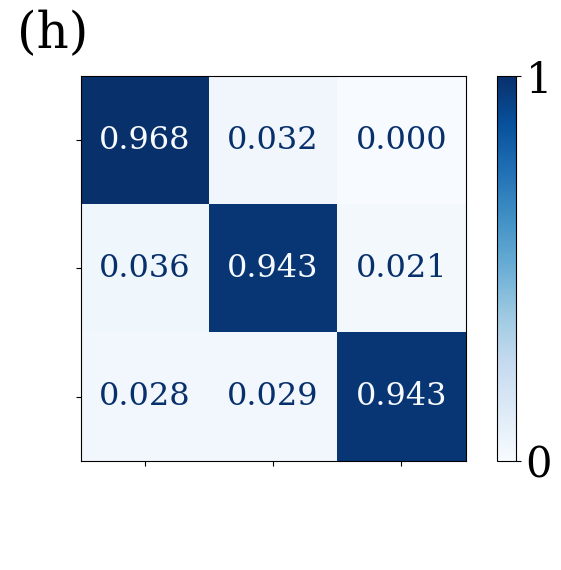

In [7]:
d1n = 'dos_MKf_eta0.20.h5'
d2n = 'dos_MKfb_eta0.50.h5'

RunTrain('dos_MKf_eta0.20_bins256.h5',\
         mcn_list,\
         mcn_full_list,\
         show_yticks_list,\
         show_xticks=False)
RunValidate('dos_MKf_eta0.20_bins256.h5',\
            'dos_MKfb_eta0.20_bins256.h5',\
            mcn_list,\
            ['(e)', '(f)', '(g)', '(h)'],\
            show_yticks_list,\
            pad=1.05,\
            show_xticks=False)

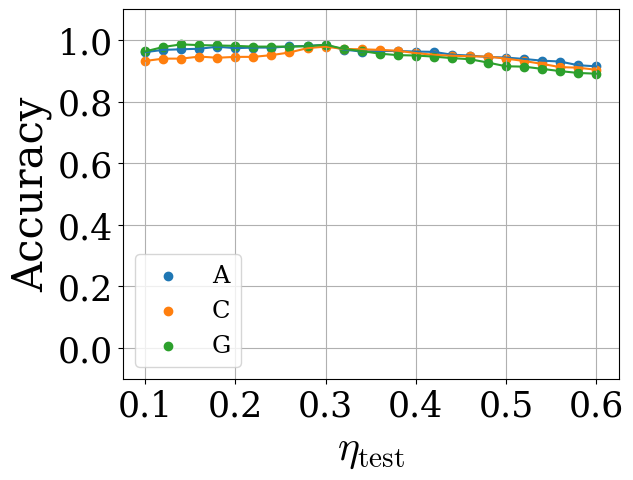

In [24]:
mcn = 'rf'
d1n = 'peak_GK_eta0.20.h5'
d2n = 'peak_DK_eta0.10.h5'
y_test, y_pred, y_score, df1_test, df2_test, mc = ms.Validate(d1n, d2n, mcn)
print(np.average([est.get_depth() for est in mc.estimators_]), len([est.get_depth() for est in mc.estimators_]))

(15900, 15)

# Data : peak_GK_eta0.20.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.999581 (4768/4770)
# Elapsed Time : 0.474721s

(13, 15)

# Data : peak_DK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.461538 (6/13)
# Elapsed Time : 0.086920s

17.64 100


In [30]:
mcn = 'rf'
d1n = 'dos_MK_eta0.10.h5'
d2n = 'dos_MK_eta0.10.h5'
y_test, y_pred, y_score, df1_test, df2_test, mc = ms.Validate(d1n, d2n, mcn)
print(np.average([est.get_depth() for est in mc.estimators_]), len([est.get_depth() for est in mc.estimators_]))


# Data : dos_MK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.970819 (865/891)
# Elapsed Time : 0.301137s


# Data : dos_MK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.991240 (2942/2968)
# Elapsed Time : 0.470252s

14.07 100


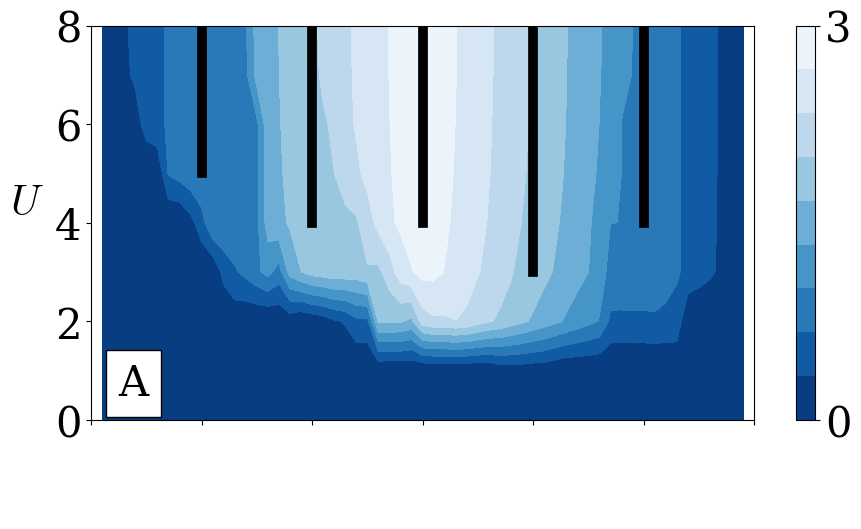

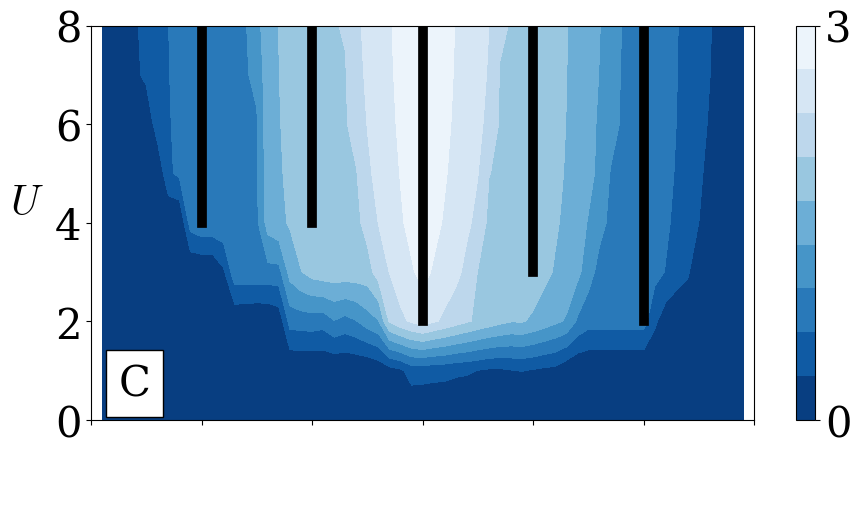

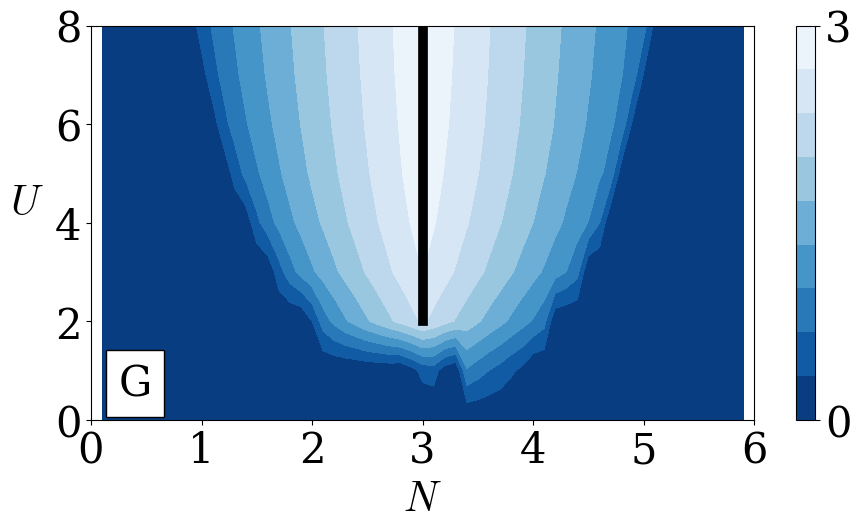

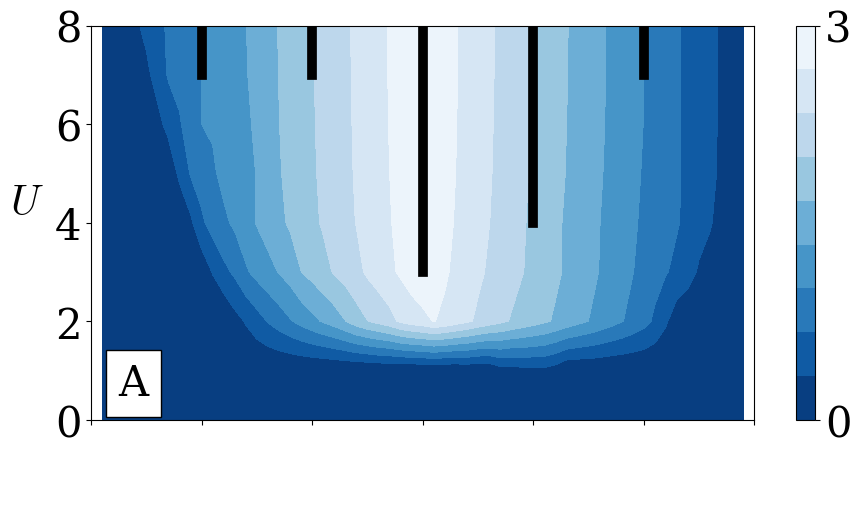

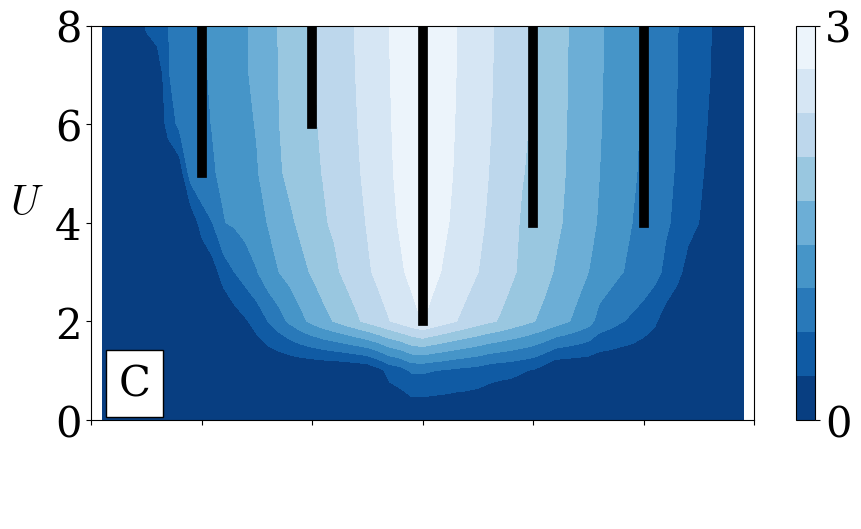

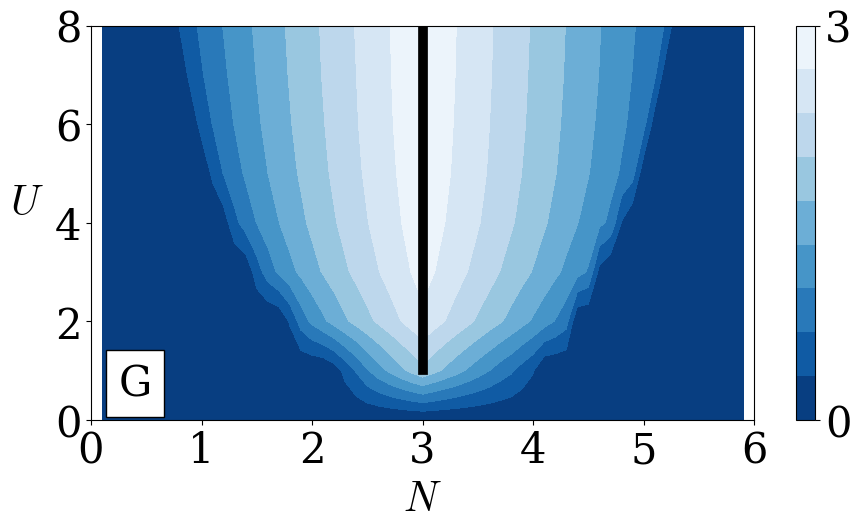

In [2]:
dr = draw.Draw('baoso3_dU1.0', 0, 0)
for t, x in zip(['a', 'c', 'g'], [False, False, True]): dr.DrawPhase(t, xtick=x)
    
dr = draw.Draw('baoso3_dU1.0_JU0.15', 0.15, 0)
for t, x in zip(['a', 'c', 'g'], [False, False, True]): dr.DrawPhase(t, xtick=x)

output/baoso3_dU1.0//JU0.00_SOC0.00/band_g0_N6.0_U1.0_n5.9976519417630714_m0.8811194368625579_e42.6616037315397065_gap0.0018799039187316_fermi7.9762579502515250_dntop7.9745323546310161_2229.txt


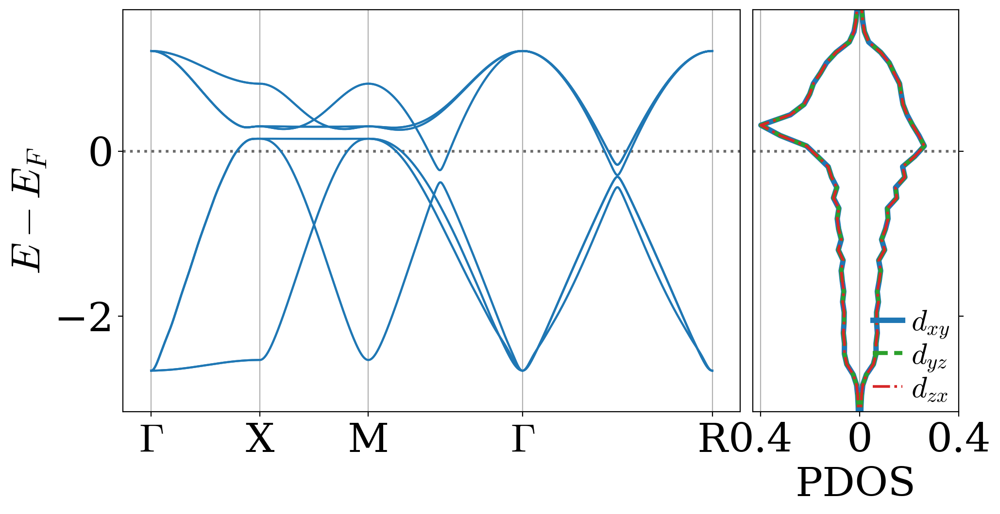

In [2]:
dr = draw.Draw(name, 0.0, 0)
#fig, ax = plt.subplots(dpi=200)
#emin, emax, _, _ = dr.DrawBand('g0', 6, 1, ax=ax, is_unfold=1)
dr.DrawBandDOS('g0', 6, 1, is_unfold=0)
"""
for j in [0, 0.1, 0.2]:
    dr = draw.Draw(name, j, 0)
    for t in ['a', 'c', 'g']:
        dr.DrawPhase(t)
"""
plt.show()


# Data : peak_GK_eta0.10.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.999825 (11428/11430)
# Elapsed Time : 0.826234s


# Data : peak_DK_eta0.10.h5
# Machine : cat
# Resampler : none
# Accuracy : 0.923077 (12/13)
# Elapsed Time : 0.003856s

   type   JU    N    U    m  fermi  gap type_p  \
0     g  0.2  0.0  5.0  0.0    0.0  0.0      g   
1     g  0.2  0.0  5.0  0.0    0.0  0.0      g   
2     g  1.0  0.0  5.0  0.0    0.0  0.0      g   
3     c  2.0  0.0  6.0  0.0    0.0  0.0      c   
4     a  2.0  0.0  7.0  0.0    0.0  0.0      a   
5     c  2.0  0.0  7.0  0.0    0.0  0.0      c   
6     g  0.2  0.0  7.0  0.0    0.0  0.0      g   
7     g  2.0  0.0  5.0  0.0    0.0  0.0      g   
8     a  2.0  0.0  7.0  0.0    0.0  0.0      a   
9     c  0.2  0.0  7.0  0.0    0.0  0.0      c   
10    g  0.0  0.0  7.0  0.0    0.0  0.0      c   
11    c  0.2  0.0  7.0  0.0    0.0  0.0      c   
12    g  0.0  0.0  7.0  0.0    0.0  0.0      g   

                                             scor

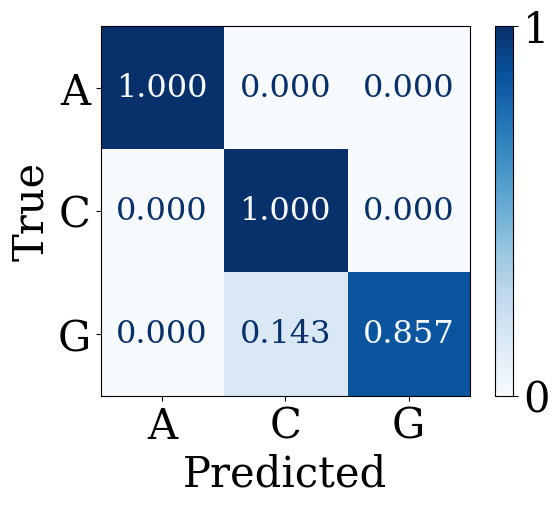

NameError: name 'eta' is not defined

In [38]:
mcn = 'cat'
eta1 = 0.10
eta2 = 0.10
y_test, y_pred, y_score, df1_test, df2_test, mc = ms.Validate('peak_GK_eta%.2f.h5'%eta1, 'peak_DK_eta%.2f.h5'%eta2, mcn)
print(df2_test)
fig, ax = plt.subplots()
ms.DrawConfMat(y_test, y_pred, ax=ax)
ax.set_title='%s eta%.2f'%(mcn, eta)
fig,ax= plt.subplots(figsize=(20, 20))
ms.DrawTree(mc, mcn_full=''['%s%d' % (l, i) for l in ms.labels for i in range(ms.PEAK_MAX)], ax=ax)
#ms.DrawImps(mc, ['%s%d' % (l, i) for l in ms.labels for i in range(ms.PEAK_MAX)])

(15900, 15)

# Data : peak_GK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.998952 (4765/4770)
# Elapsed Time : 0.484069s

(25, 15)

# Data : peak_DK_eta0.02.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.600000 (15/25)
# Elapsed Time : 0.090485s

(15900, 15)

# Data : peak_GK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.998952 (4765/4770)
# Elapsed Time : 0.472532s

(13, 15)

# Data : peak_DK_eta0.04.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.461538 (6/13)
# Elapsed Time : 0.076442s

(15900, 15)

# Data : peak_GK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.998952 (4765/4770)
# Elapsed Time : 0.470079s

(13, 15)

# Data : peak_DK_eta0.06.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.769231 (10/13)
# Elapsed Time : 0.077307s

(15900, 15)

# Data : peak_GK_eta0.10.h5
# Machine : rf
# Resampler : none
# Accuracy : 0.998952 (4765/4770)
# Elapsed Time : 0.473364s

(13, 15)

# Data : peak_DK_eta0.08.h5
# Machine : rf
# Resample

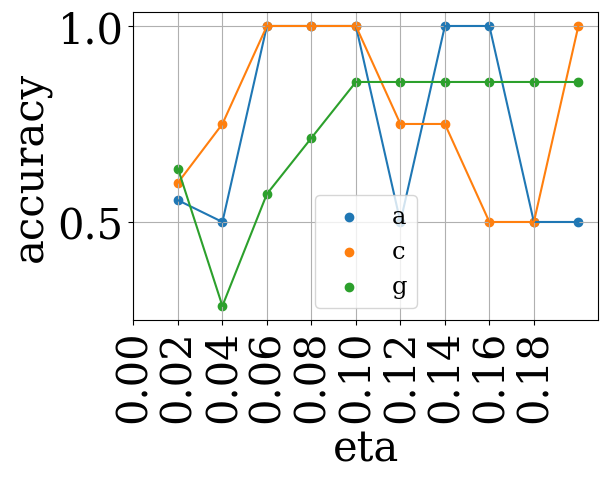

In [14]:
d1n='peak_GK_eta0.10.h5'
acc = []
for eta in np.arange(0.02, 0.22, 0.02):
    d2n='peak_DK_eta%.2f.h5' % eta
    y_test, y_pred, _, _, _, _ = ms.Validate(d1n, d2n, mcn)
    acc_i=[confusion_matrix(y_test, y_pred)[i][i]/np.sum(confusion_matrix(y_test, y_pred)[i]) for i in range(3)]
    acc.append(acc_i)
    
x_range= np.arange(0.02, 0.22, 0.02)
acc=np.array(acc)
fig, ax = plt.subplots(figsize=(6, 4))
for i, t in enumerate(['a', 'c', 'g']):
    ax.plot(x_range, acc[:, i])
    ax.scatter(x_range, acc[:, i], label=t)
plt.legend(fontsize='xx-small')
plt.xticks(np.arange(0, 0.2, 0.02), rotation=90)
plt.xlabel('eta')
plt.ylabel('accuracy')
plt.grid()
plt.show()

In [ ]:
# 틀린 데이터 spectrum feature 확인해서 어떻게l 해야 맞추는지 
# drawtree max_depth=4 로 해서 그리기

In [ ]:
# 특정 N, U
# 모든 kpoint에 대해 gap이 있다면 레벨 옮겨도 됨
# point 절대값이 아니라 두 point 사이의 상관관계까지 고려할줄아는 머신 필요
# 각 kpoint마다의 gap


### 다양한 fermi level에 대한 학습 필요
# gap을 10등분해서 기존 fermi level을 각 점에 대응하게끔 조정
# 각 type마다 gap이 있는 kpoint를 알고있음
# fermi level, 특정 kpoint의 에너지 차이를 10등분한걸 fermi level로 사용
# fermi lelvel 아래는 (0-9)/10, 위는 (1-9)/10

# a-, c-, g-M

In [ ]:
# c->g 일수도(Hz=0일때)
# 위에서 하나 아래서 하나!
# Hz=0인 c빼고 하기
# epsilon 교차검증 해보기

In [ ]:
# 평행이동 하려면 de랑 dfermi랑 같아야함
# 솔루션에서 가능한 fermi min, max

# 에너지 그리드보다 낮은 shift는 영향 X
# shift 폭을 de로 하는게 합리적 de

In [ ]:
"""
from sklearn import tree

dn = 'rdos_dt1_eta0.200_bins512.h5'
mcn = 'rf'
bins = 512
_, _, _, _, mc = ms.Train(dn, mcn)
fn = ['%s%d' % (l, b) for l in ms.labels for b in range(bins)]

def DrawTree(mc, fn):

    
def DrawImps(mc, fn, bins):
    importances = mc.feature_importances_
    std = np.std([tree.feature_importances_ for tree in mc.estimators_], axis=0)
    forest_importances = pd.Series(importances, index=fn)
    
    fig, ax = plt.subplots(4, 1, sharey=True, figsize=(120, 80))
    for i in range(4):
        imp_s = forest_importances[bins*i:bins*(i+1)]
        std_s = std[bins*i:bins*(i+1)]
        #imp_s.plot.bar(yerr=std_s, ax=ax[i])
        imp_s.plot.bar(ax=ax[i])
        ax[i].set_title("%s" % ms.labels[i], loc='left')
    #ax.set_title("Feature importances using MDI")
    #ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    
DrawTree(mc, fn)
DrawImps(mc, fn, bins)
"""

In [ ]:
"""
def GetIdx0(df):
    for i in df.index:
        data = df.loc[i, :]
        dn = '%s/JU%.2f_SOC%.2f/' % (path_output, data['JU'], data['SOC'])
        d = [f for f in os.listdir(dn) if\
             re.match('band_.+N%.1f_U%.1f_.+m%f_.+fermi%f_' %\
                      (data['N'], data['U'], data['m'], data['fermi']), f)]
        df.loc[i, 'type'] = re.sub('band_', '',\
                                   re.search('band_[a-z]+\d?', d[0]).group())
    
    df['type_f'] = df['type_f'].replace(types_dict_inv)
    
    return df

def DrawHist(df, title, params, n):
    bins = len(df) - len(params)
    hist = df.drop(params, axis=1).sum()
    x = hist.index.to_list()
    
    xt = np.arange(0, len(x), bins//n, dtype=int)
    xt = np.append(xt, len(x)-1)
    
    fig, ax = plt.subplots(figsize=figsize, dpi=500)
    ax.bar(x, hist)
    ax.set_xticks([x[i] for i in xt])
    ax.set_title(title, loc='left')
    plt.show()
    
def DrawInput(df, title, prefix=''):
    alpha = 0.5
    bins0 = [len(np.unique(df['JU'])), len(np.unique(df['N']))//4, len(np.unique(df['U']))]
    xlim = [[-0.01, 0.31], [0, 12], [-0.1, 5.1]]
    
    for i, v in enumerate(['JU', 'N', 'U']):
        fig, ax = plt.subplots(figsize=figsize)
        _, bins = np.histogram(df[v], bins=bins0[i])
        for j, t in enumerate(types):
            df[df['type'] == j].hist(column=[v], ax=ax, bins=bins, alpha=alpha, label=t)
        ax.set_xlim(xlim[i])
        ax.legend()
        ax.set_title('%s%s\n'%(prefix,v)+title, loc='left')
        plt.title('')
    plt.show()

def DrawOutput(df, title, prefix='', zoom=False):
    bins0 = 50
    bins_ins0 = 20
    alpha = 0.5
    xlim = [[-0.1, 6.1], [], []]
    xlim_ins = [[-0.1, 1], [0, 10], [-0.1, 0.5]]
    
    for i, v in enumerate(['m', 'dntop', 'gap']):
        fig, ax = plt.subplots(figsize=figsize)
        _, bins = np.histogram(df[v], bins=bins0)
        for j, t in enumerate(types):
            df[df['type'] == j].hist(column=[v], ax=ax, bins=bins, alpha=alpha, label=t)

        if zoom:
            ins = ax.inset_axes([0.4,0.6,0.3,0.3])
            _, bins_ins = np.histogram(df[v], bins=bins_ins0)
            for j, t in enumerate(types):
                df[df['type'] == j].hist(column=[v], ax=ins, bins=bins_ins, alpha=alpha, label=t)
            ins.set_xlim(xlim_ins[i])
            ins.set_title('')
        if len(xlim[i]): ax.set_xlim(xlim[i])
        ax.legend()
        ax.set_title('%s%s\n'%(prefix,v)+title, loc='left')
        plt.title('')
    plt.show()
    
def DrawType(df, title, prefix=''):
    fig, ax = plt.subplots(figsize=figsize)
    
    df.hist(column=['type'], ax=ax)
    
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(types)
    ax.set_xlim([-0.1, 2.1])
    ax.set_ylim([0, 1800])
    ax.set_title('%stype\n'%(prefix)+title, loc='left')
    plt.title('')
    plt.show()
    
def DrawMisType(df, title):
    bins0 = len(types)
    alpha = 0.5
    
    fig, ax = plt.subplots(figsize=figsize)
    _, bins = np.histogram(df['type'], bins=bins0)
    for i, t in enumerate(types):
        df[df['type_f'] == i].hist(column=['type'], ax=ax, bins=bins, alpha=alpha, label=types[i])
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(types)
    ax.set_xlim([-0.1, 2.1])
    ax.legend()
    ax.set_title('misclassifed type\n'+title, loc='left')
    plt.title('')
    plt.show()
    
def DrawCorr(df):
    fig, ax = plt.subplots(figsize=figsize)
    corr = df.loc[:, ['JU', 'N', 'U', 'm', 'dntop', 'gap']].corr()
    sns.heatmap(corr, annot=True, fmt='.1f', ax=ax)
    plt.show()
    
def DrawImp(rf, bins, feature_names, title):
    estimators = rf.estimators_
    importances = rf.feature_importances_
    forest_importances = pd.Series(importances, index=feature_names)
    
    xt = np.arange(0, len(feature_names), bins//4, dtype=int)
    xt = np.append(xt, len(feature_names)-1)

    fig, ax = plt.subplots(figsize=(25, 6))
    std = np.std([importances for tree in estimators], axis=0)
    forest_importances.plot.bar(yerr=std, ax=ax)
    ax.set_xticks(xt)
    ax.set_title("Feature importances %s" % title)
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
"""